<div style="text-align: center;">
    <h1><strong>AMCAT Data Analysis</strong></h1>
</div>

Intern ID : IN9240233

### Performing Exploratory Data Analysis (EDA) with Salary as a target variable. 

The detailed description about the dataset can be found here. 

**Dataset Description.**

The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate.

<div style="text-align: center;">
    <strong>Table Description</strong>
</div>

| VARIABLES | TYPE | Description |
|---------|----|-----------|
| ID      | UID | A unique ID to identify a candidate |
| Salary  | Continuous | Annual CTC oﬀered to the candidate (in INR) |
| DOJ | Date | Date of joining the company |
| DOL | Date | Date of leaving the company |
| Designation | Categorical | Designation oﬀered in the job |
| JobCity | Categorical | Location of the job (city) |
| Gender | Categorical | Candidate’s gender |
| DOB | Date | Date of birth of candidate |
| 10percentage | Continuous | Overall marks obtained in grade 10 examinations | 
| 10board | Continuous | The school board whose curriculum the candidate followed in grade 10 |
| 12graduation | Date | Year of graduation - senior year high school |
| 12percentage | Continuous | Overall marks obtained in grade 12 examinations |
| 12board | Date | The school board whose curriculum the candidate followed in grade 12 |
| CollegeID | NA/ID | Unique ID identifying the college which the candidate attended |
| CollegeTier | Categorical | Tier of college |
| Degree | Categorical | Degree obtained/pursued by the candidate |
| Specialization | Categorical | Specialization pursued by the candidate |
| CollegeGPA | Continuous | Aggregate GPA at graduation |
| CollegeCityID | NA/ID | A unique ID to identify the city in which the college is located in |
| CollegeCityTier | Categorical | The tier of the city in which the college is located |
| CollegeState | Categorical | Name of States |
| GraduationYear | Date | Year of graduation (Bachelor’s degree) |
| English | Continuous | Scores in AMCAT English section |
| Logical | Continuous | Scores in AMCAT Logical section |
| Quant | Continuous | Scores in AMCAT Quantitative section |
| Domain | Continuous/ Standardized | Scores in AMCAT’s domain module |
| ComputerProgramming | Continuous | Score in AMCAT’s Computer programming section |
| ElectronicsAndSemicon | Continuous | Score in AMCAT’s Electronics & Semiconductor Engineering section |
| ComputerScience | Continuous | Score in AMCAT’s Computer Science section |
| MechanicalEngg | Continuous | Score in AMCAT’s Mechanical Engineering section |
| ElectricalEngg | Continuous | Score in AMCAT’s Electrical Engineering section |
| TelecomEngg | Continuous | Score in AMCAT’s Telecommunication Engineering section |
| CivilEngg | Continuous | Score in AMCAT’s Civil Engineering section |
| conscientiousness | Continuous/ Standardized | Scores in one of the sections of AMCAT’s personality test |
| agreeableness | Continuous/ Standardized | Scores in one of the sections of AMCAT’s personality test | 
| extraversion | Continuous/ Standardized | Scores in one of the sections of AMCAT’s personality test |
| neuroticism | Continuous/ Standardized | Scores in one of the sections of AMCAT’s personality test |
| openess_to_experience | Continuous/ Standardized | Scores in one of the sections of AMCAT’s personality test |

 


In [1]:
# Importing Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

from scipy.stats import chi2_contingency, f_oneway, ttest_ind

from datetime import datetime

In [2]:
df = pd.read_csv('data.xlsx - Sheet1.csv')
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


## Data Understanding

In [3]:
df.shape

(3998, 39)

There are 3998 rows and 39 columns.

In [4]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

There are 11 categorical columns and 27 numerical columns.

In [6]:
df.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

There are no null values in any of the columns.

In [7]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
3993    False
3994    False
3995    False
3996    False
3997    False
Length: 3998, dtype: bool

There are no duplicate values in any of the columns.

In [8]:
# Five-Point-Summary

df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


## Data Cleaning

In [9]:
df['Unnamed: 0'].value_counts()

train    3998
Name: Unnamed: 0, dtype: int64

In [10]:
# Dropping column Unnamed: 0 as it has the same category throughout the dataset and there is no data description of this column

df.drop(columns=['Unnamed: 0'],inplace=True)

In [11]:
# Converting date of joining column to data time format

df['DOJ'] = pd.to_datetime(df['DOJ'])

In [12]:
# Using lambda function to convert date values to left

df['DOL']

0            present
1            present
2            present
3            present
4        3/1/15 0:00
            ...     
3993    10/1/12 0:00
3994     7/1/13 0:00
3995         present
3996     1/1/15 0:00
3997         present
Name: DOL, Length: 3998, dtype: object

In [13]:
current_datetime = datetime.now()

In [14]:
df['Working Status'] = df['DOL'].apply(lambda x: current_datetime if x == 'present' else pd.to_datetime(x))

In [15]:
df['Working Status']

0      2024-10-11 21:32:57.480262
1      2024-10-11 21:32:57.480262
2      2024-10-11 21:32:57.480262
3      2024-10-11 21:32:57.480262
4      2015-03-01 00:00:00.000000
                  ...            
3993   2012-10-01 00:00:00.000000
3994   2013-07-01 00:00:00.000000
3995   2024-10-11 21:32:57.480262
3996   2015-01-01 00:00:00.000000
3997   2024-10-11 21:32:57.480262
Name: Working Status, Length: 3998, dtype: datetime64[ns]

In [16]:
# Converting date of birth column to data time format

df['DOB'] = pd.to_datetime(df['DOB'])

In [17]:
# It is a categorical column with numeric values

df['CollegeTier'].value_counts()

2    3701
1     297
Name: CollegeTier, dtype: int64

In [18]:
df['CollegeCityTier'].value_counts()

0    2797
1    1201
Name: CollegeCityTier, dtype: int64

### Univariate Analysis

In [19]:
num = df.select_dtypes(include='number').columns.to_list()
num

['ID',
 'Salary',
 '10percentage',
 '12graduation',
 '12percentage',
 'CollegeID',
 'CollegeTier',
 'collegeGPA',
 'CollegeCityID',
 'CollegeCityTier',
 'GraduationYear',
 'English',
 'Logical',
 'Quant',
 'Domain',
 'ComputerProgramming',
 'ElectronicsAndSemicon',
 'ComputerScience',
 'MechanicalEngg',
 'ElectricalEngg',
 'TelecomEngg',
 'CivilEngg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [20]:
id_s = ['ID','CollegeID','CollegeCityID']

In [21]:
scores = [
 '10percentage',
 '12percentage',
 'collegeGPA',
 'English',
 'Logical',
 'Quant',
 'Domain',
 'ComputerProgramming',
 'ElectronicsAndSemicon',
 'ComputerScience',
 'MechanicalEngg',
 'ElectricalEngg',
 'TelecomEngg',
 'CivilEngg',
 'conscientiousness',
 'agreeableness',
 'extraversion',
 'nueroticism',
 'openess_to_experience']

In [22]:
y = ['Salary']

In [23]:
grad_year = ['12graduation', 'GraduationYear']
tier = ['CollegeTier', 'CollegeCityTier'] # Category column with numeric value

In [24]:
cat = df.select_dtypes(include='object').columns.to_list()
cat

['DOL',
 'Designation',
 'JobCity',
 'Gender',
 '10board',
 '12board',
 'Degree',
 'Specialization',
 'CollegeState']

In [25]:
dates = ['DOJ','Working Status','DOB']

In [26]:
cat_col = ['Designation','JobCity','Gender','10board','12board','Degree','Specialization','CollegeState']

**Variables**

- num - all numerical features
- id_s - Id's of Candidate, College and College City
- scores - all individual scores of candidates
- y - Salary feature (target variable)
- grad_year - years of 12th and graduation
- tier - categorical tier wih numeric values
- dates - Datetime values of Date of Joining, Date of Leaving and Date of Birth
- cat_col - all the categorical columns

### STATISTICAL ANALYSIS

#### Measure of central tendency

In [27]:
# Mean

df[y].mean()

Salary    307699.849925
dtype: float64

In [28]:
# Median

df[y].median()

Salary    300000.0
dtype: float64

In [29]:
# Mode

for i in grad_year:
    print('The mode value of the columns',i,'is',df[i].mode()[0])

The mode value of the columns 12graduation is 2009
The mode value of the columns GraduationYear is 2013


In [30]:
# Mode

for i in tier:
    print('The mode value of the columns',i,'is',df[i].mode()[0])

The mode value of the columns CollegeTier is 2
The mode value of the columns CollegeCityTier is 0


In [31]:
# Mean

for i in scores:
    print('The mean value of the columns',i,'is',df[i].mean())

The mean value of the columns 10percentage is 77.9254427213607
The mean value of the columns 12percentage is 74.46636568284141
The mean value of the columns collegeGPA is 71.48617058529265
The mean value of the columns English is 501.64907453726863
The mean value of the columns Logical is 501.59879939969983
The mean value of the columns Quant is 513.3781890945472
The mean value of the columns Domain is 0.5104896530031996
The mean value of the columns ComputerProgramming is 353.10280140070034
The mean value of the columns ElectronicsAndSemicon is 95.32841420710355
The mean value of the columns ComputerScience is 90.7423711855928
The mean value of the columns MechanicalEngg is 22.97473736868434
The mean value of the columns ElectricalEngg is 16.478739369684842
The mean value of the columns TelecomEngg is 31.851175587793897
The mean value of the columns CivilEngg is 2.68384192096048
The mean value of the columns conscientiousness is -0.03783129064532267
The mean value of the columns agree

In [32]:
# Median

for i in scores:
    print('The median value of the columns',i,'is',df[i].median())

The median value of the columns 10percentage is 79.15
The median value of the columns 12percentage is 74.4
The median value of the columns collegeGPA is 71.72
The median value of the columns English is 500.0
The median value of the columns Logical is 505.0
The median value of the columns Quant is 515.0
The median value of the columns Domain is 0.6226429158
The median value of the columns ComputerProgramming is 415.0
The median value of the columns ElectronicsAndSemicon is -1.0
The median value of the columns ComputerScience is -1.0
The median value of the columns MechanicalEngg is -1.0
The median value of the columns ElectricalEngg is -1.0
The median value of the columns TelecomEngg is -1.0
The median value of the columns CivilEngg is -1.0
The median value of the columns conscientiousness is 0.0464
The median value of the columns agreeableness is 0.2124
The median value of the columns extraversion is 0.0914
The median value of the columns nueroticism is -0.2344
The median value of the 

In [33]:
# Mode

for i in scores:
    print('The mode value of the columns',i,'is',df[i].mode()[0])

The mode value of the columns 10percentage is 78.0
The mode value of the columns 12percentage is 70.0
The mode value of the columns collegeGPA is 70.0
The mode value of the columns English is 475
The mode value of the columns Logical is 495
The mode value of the columns Quant is 605
The mode value of the columns Domain is -1.0
The mode value of the columns ComputerProgramming is -1
The mode value of the columns ElectronicsAndSemicon is -1
The mode value of the columns ComputerScience is -1
The mode value of the columns MechanicalEngg is -1
The mode value of the columns ElectricalEngg is -1
The mode value of the columns TelecomEngg is -1
The mode value of the columns CivilEngg is -1
The mode value of the columns conscientiousness is 0.2718
The mode value of the columns agreeableness is 0.3789
The mode value of the columns extraversion is 0.4711
The mode value of the columns nueroticism is -0.4879
The mode value of the columns openess_to_experience is 0.6721


#### Measures of dispersion

In [34]:
for i in scores:
    print('The range value of the columns',i,'is',df[i].max()-df[i].min())

The range value of the columns 10percentage is 54.760000000000005
The range value of the columns 12percentage is 58.7
The range value of the columns collegeGPA is 93.48
The range value of the columns English is 695
The range value of the columns Logical is 600
The range value of the columns Quant is 780
The range value of the columns Domain is 1.9999104076
The range value of the columns ComputerProgramming is 841
The range value of the columns ElectronicsAndSemicon is 613
The range value of the columns ComputerScience is 716
The range value of the columns MechanicalEngg is 624
The range value of the columns ElectricalEngg is 677
The range value of the columns TelecomEngg is 549
The range value of the columns CivilEngg is 517
The range value of the columns conscientiousness is 6.122
The range value of the columns agreeableness is 7.6864
The range value of the columns extraversion is 7.1363
The range value of the columns nueroticism is 5.9955
The range value of the columns openess_to_exp

In [35]:
for i in scores:
    print('The Maximum value of the columns',i,'is',df[i].max())

The Maximum value of the columns 10percentage is 97.76
The Maximum value of the columns 12percentage is 98.7
The Maximum value of the columns collegeGPA is 99.93
The Maximum value of the columns English is 875
The Maximum value of the columns Logical is 795
The Maximum value of the columns Quant is 900
The Maximum value of the columns Domain is 0.9999104076
The Maximum value of the columns ComputerProgramming is 840
The Maximum value of the columns ElectronicsAndSemicon is 612
The Maximum value of the columns ComputerScience is 715
The Maximum value of the columns MechanicalEngg is 623
The Maximum value of the columns ElectricalEngg is 676
The Maximum value of the columns TelecomEngg is 548
The Maximum value of the columns CivilEngg is 516
The Maximum value of the columns conscientiousness is 1.9953
The Maximum value of the columns agreeableness is 1.9048
The Maximum value of the columns extraversion is 2.5354
The Maximum value of the columns nueroticism is 3.3525
The Maximum value of 

In [36]:
for i in scores:
    print('The Minimum value of the columns',i,'is',df[i].min())

The Minimum value of the columns 10percentage is 43.0
The Minimum value of the columns 12percentage is 40.0
The Minimum value of the columns collegeGPA is 6.45
The Minimum value of the columns English is 180
The Minimum value of the columns Logical is 195
The Minimum value of the columns Quant is 120
The Minimum value of the columns Domain is -1.0
The Minimum value of the columns ComputerProgramming is -1
The Minimum value of the columns ElectronicsAndSemicon is -1
The Minimum value of the columns ComputerScience is -1
The Minimum value of the columns MechanicalEngg is -1
The Minimum value of the columns ElectricalEngg is -1
The Minimum value of the columns TelecomEngg is -1
The Minimum value of the columns CivilEngg is -1
The Minimum value of the columns conscientiousness is -4.1267
The Minimum value of the columns agreeableness is -5.7816
The Minimum value of the columns extraversion is -4.6009
The Minimum value of the columns nueroticism is -2.643
The Minimum value of the columns op

In [37]:
df[y].max() - df[y].min()

Salary    3965000.0
dtype: float64

In [38]:
df[y].max()

Salary    4000000.0
dtype: float64

In [39]:
df[y].min()

Salary    35000.0
dtype: float64

#### Skewness

In [40]:
for i in num:
    print('The skewness value of the columns',i,'is',df[i].skew())

The skewness value of the columns ID is 0.05477046850906638
The skewness value of the columns Salary is 6.451081166224832
The skewness value of the columns 10percentage is -0.5910185081648047
The skewness value of the columns 12graduation is -0.9640901430967733
The skewness value of the columns 12percentage is -0.03260741437482245
The skewness value of the columns CollegeID is 0.649176333927607
The skewness value of the columns CollegeTier is -3.2479906747351404
The skewness value of the columns collegeGPA is -1.2492091640381637
The skewness value of the columns CollegeCityID is 0.649176333927607
The skewness value of the columns CollegeCityTier is 0.8711203104937956
The skewness value of the columns GraduationYear is -63.06806402522399
The skewness value of the columns English is 0.1919970174188361
The skewness value of the columns Logical is -0.21660181091305136
The skewness value of the columns Quant is -0.01939903459277611
The skewness value of the columns Domain is -1.922145563411

#### Kurtosis

In [41]:
for i in num:
    print('The kurtosis value of the columns',i,'is',df[i].kurt())

The kurtosis value of the columns ID is -1.2226938327845243
The kurtosis value of the columns Salary is 80.92999627162538
The kurtosis value of the columns 10percentage is -0.1102843100198605
The kurtosis value of the columns 12graduation is 1.9511644059905469
The kurtosis value of the columns 12percentage is -0.6307374665885321
The kurtosis value of the columns CollegeID is -0.7674413638286568
The kurtosis value of the columns CollegeTier is 8.553722173976427
The kurtosis value of the columns collegeGPA is 10.234244459804753
The kurtosis value of the columns CollegeCityID is -0.7674413638286568
The kurtosis value of the columns CollegeCityTier is -1.2417708510593095
The kurtosis value of the columns GraduationYear is 3984.3696957519783
The kurtosis value of the columns English is -0.2541325252956774
The kurtosis value of the columns Logical is -0.2247605173210978
The kurtosis value of the columns Quant is -0.10247207606308217
The kurtosis value of the columns Domain is 3.8959505720341

#### Frequency

In [42]:
for i in cat_col:
    print(f'The frequency of the column {i} is\n{df[i].value_counts()}\n')
    print()
    print('*****')
    print()

The frequency of the column Designation is
software engineer                    539
software developer                   265
system engineer                      205
programmer analyst                   139
systems engineer                     118
                                    ... 
cad drafter                            1
noc engineer                           1
human resources intern                 1
senior quality assurance engineer      1
jr. software developer                 1
Name: Designation, Length: 419, dtype: int64


*****

The frequency of the column JobCity is
Bangalore           627
-1                  461
Noida               368
Hyderabad           335
Pune                290
                   ... 
Tirunelvelli          1
Ernakulam             1
Nanded                1
Dharmapuri            1
Asifabadbanglore      1
Name: JobCity, Length: 339, dtype: int64


*****

The frequency of the column Gender is
m    3041
f     957
Name: Gender, dtype: int64


*****

The f

### Plots

#### Box-Plot

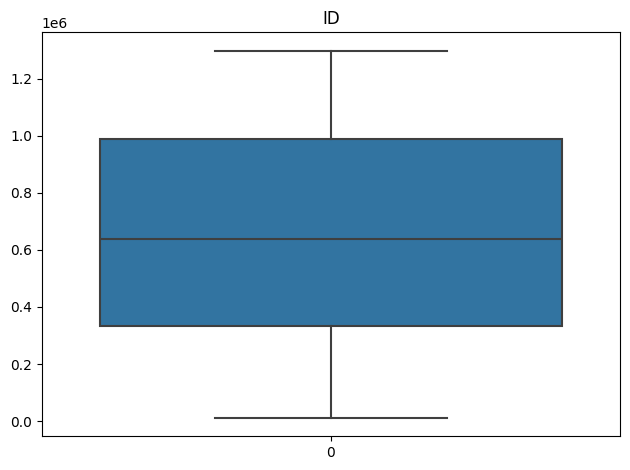

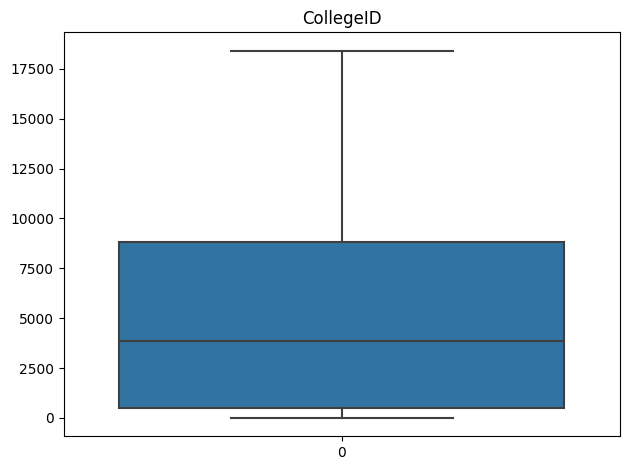

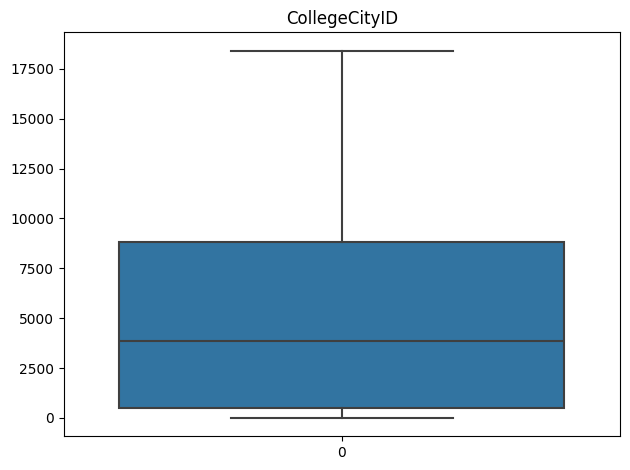

In [43]:
t = 1
for i in id_s:
    sns.boxplot(df[i])
    plt.title(i)
    t+=1
    plt.tight_layout()
    plt.show()

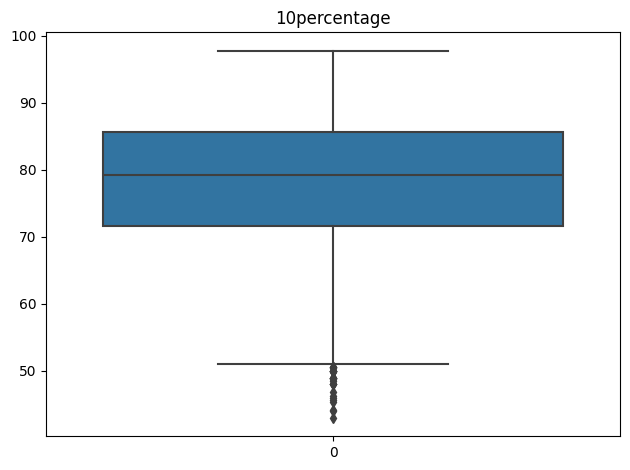

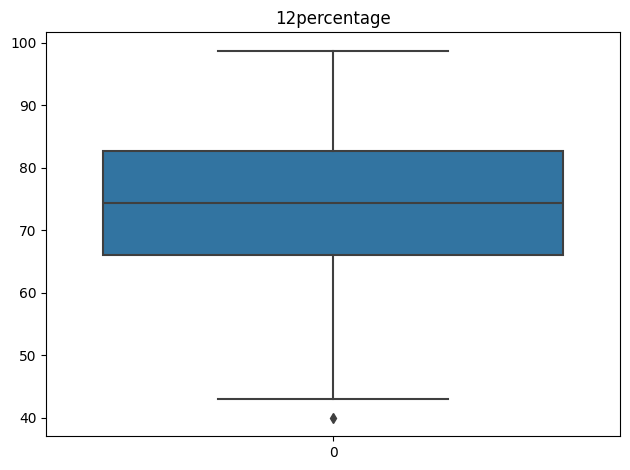

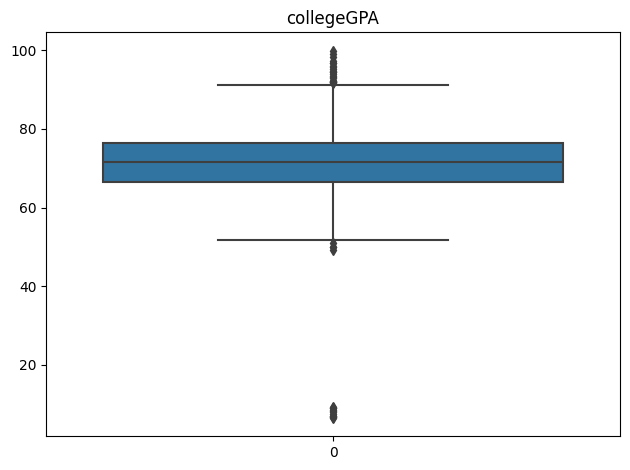

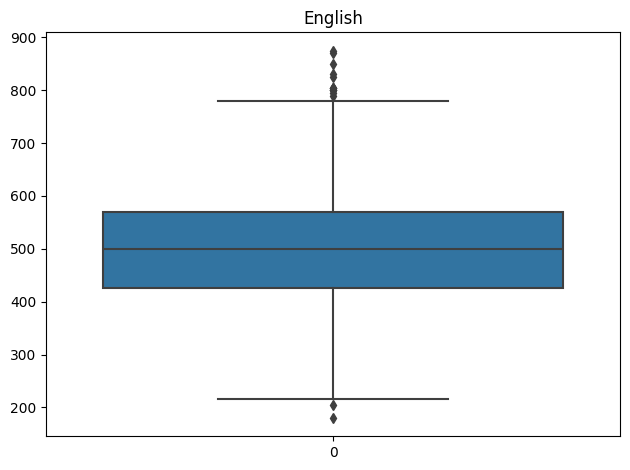

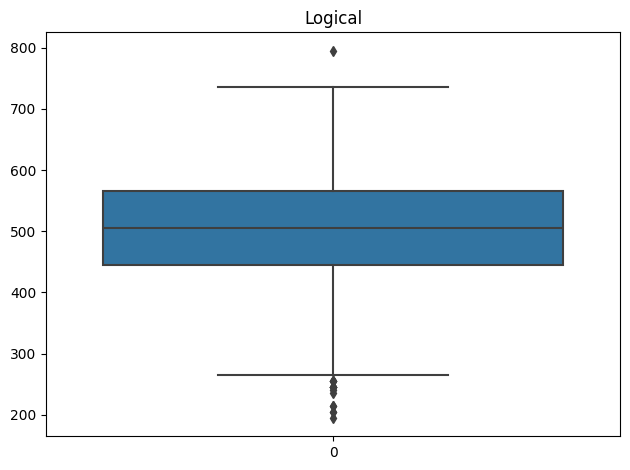

...

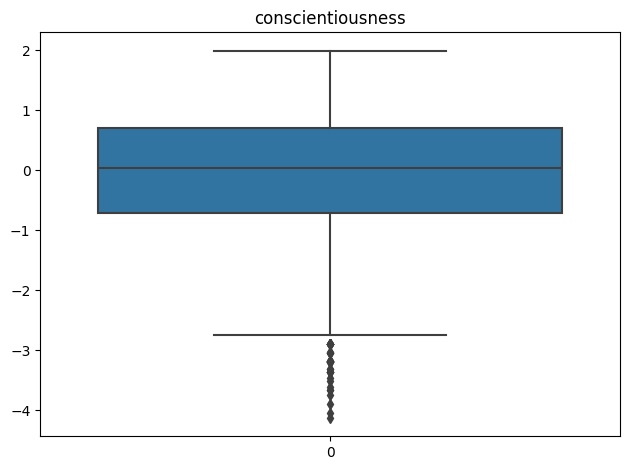

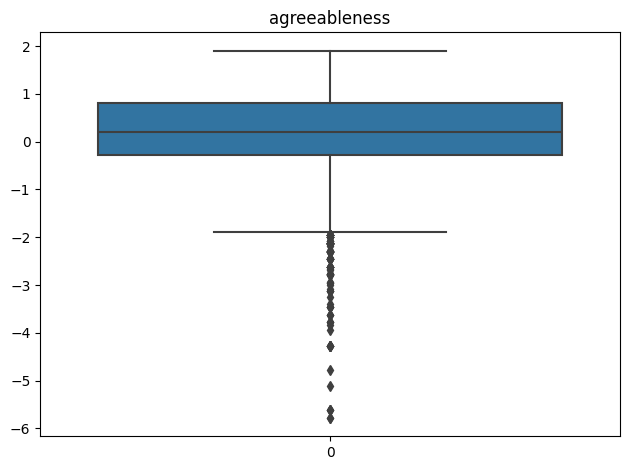

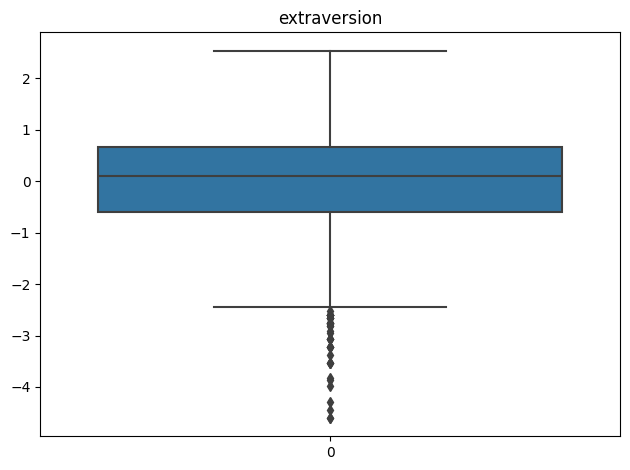

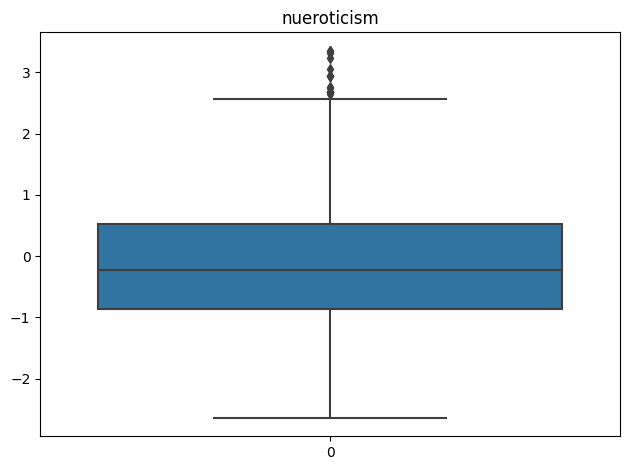

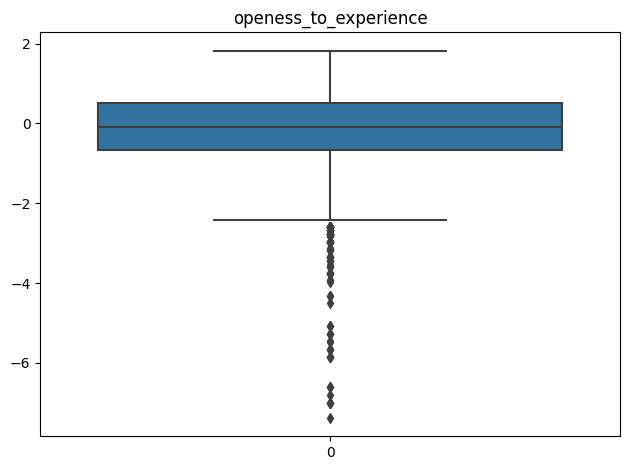

In [44]:
t = 1
for i in scores:
    sns.boxplot(df[i])
    plt.title(i)
    t+=1
    plt.tight_layout()
    plt.show()

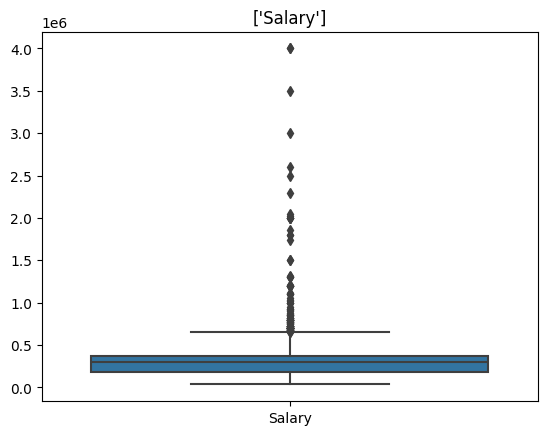

In [45]:
sns.boxplot(df[y])
plt.title(y)
plt.show()

#### Histogram

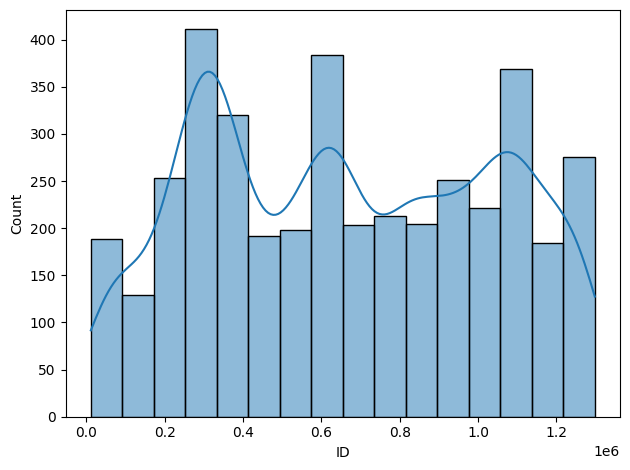

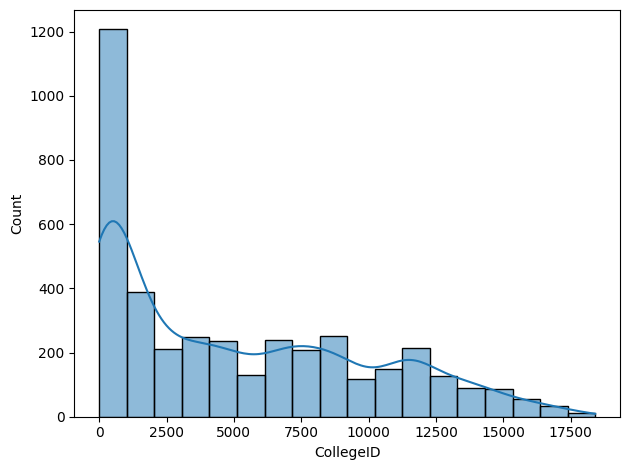

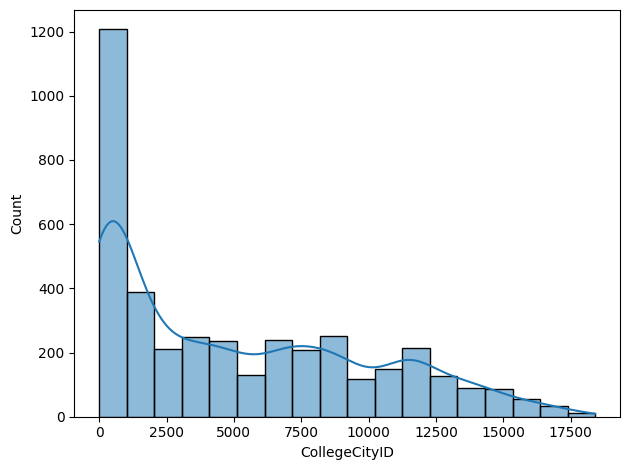

In [46]:
t=1
for i in id_s:
    sns.histplot(df[i],kde=True)
    t+=1
    plt.tight_layout()
    plt.show()

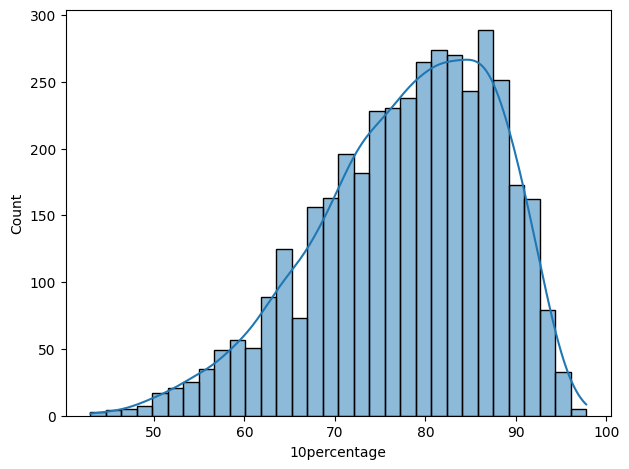

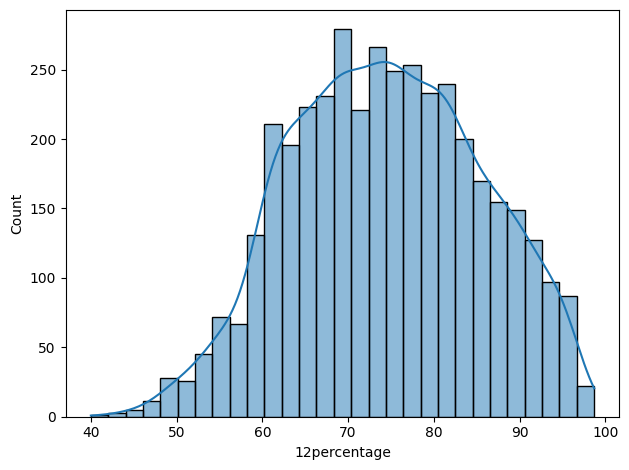

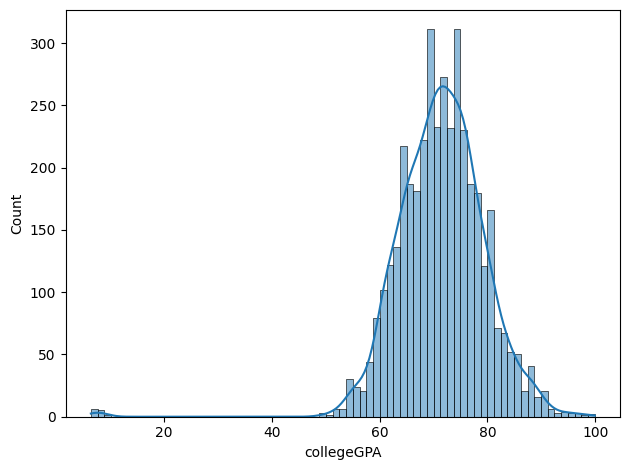

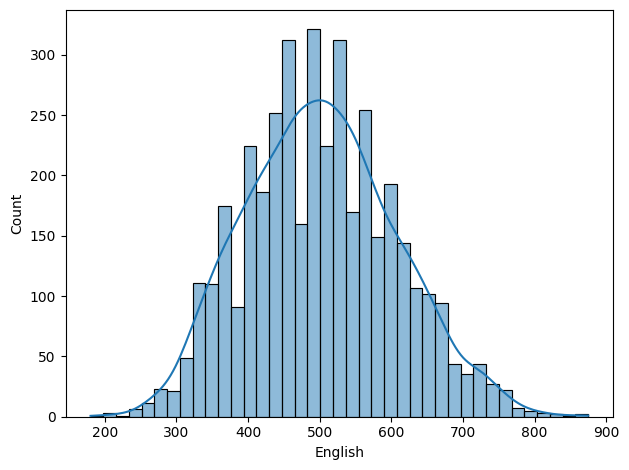

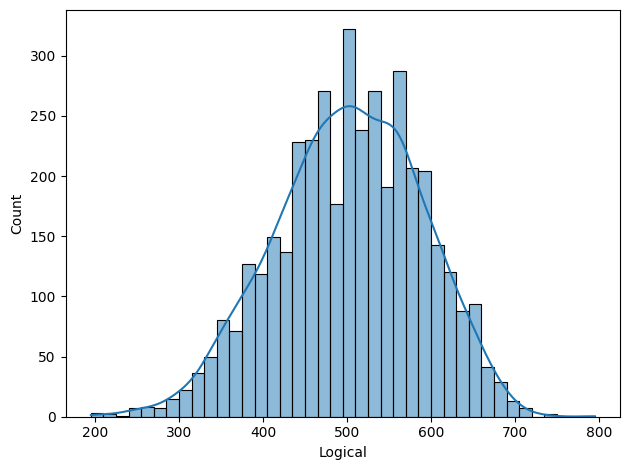

...

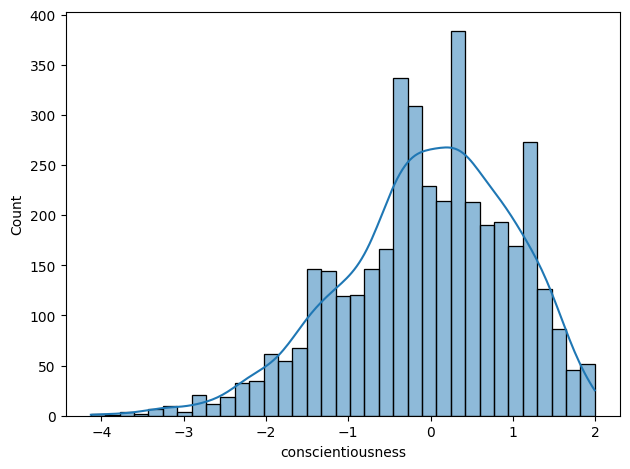

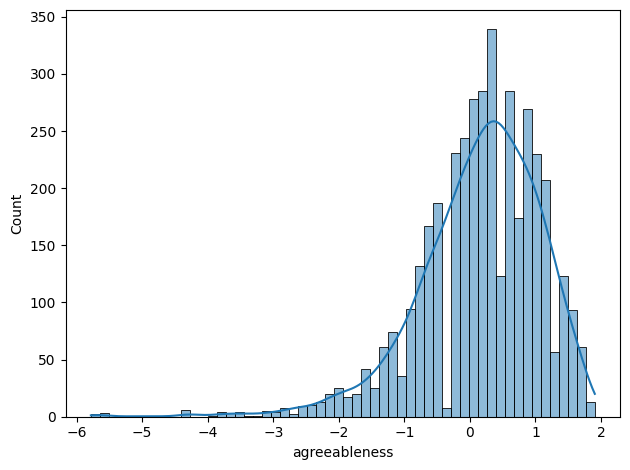

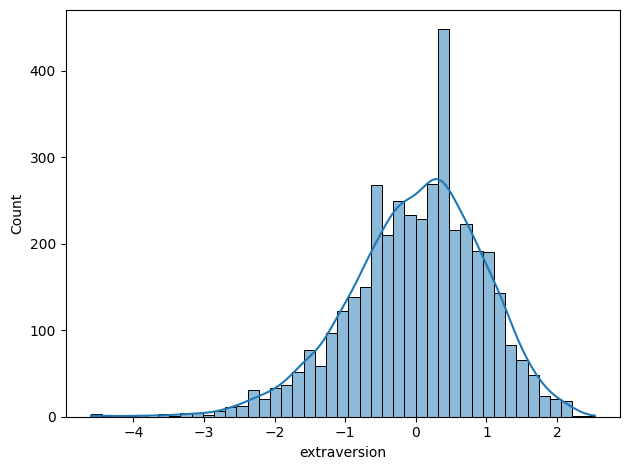

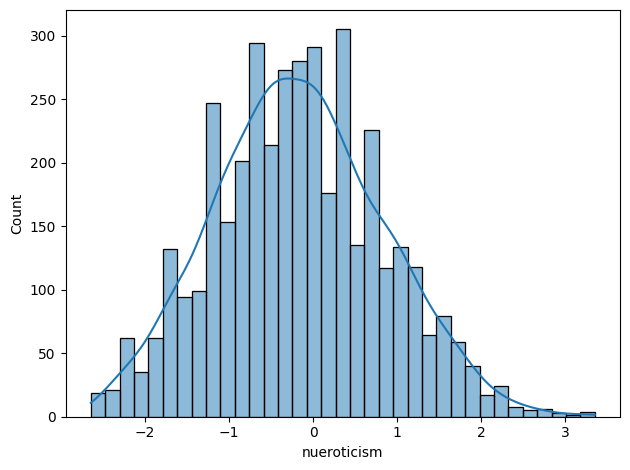

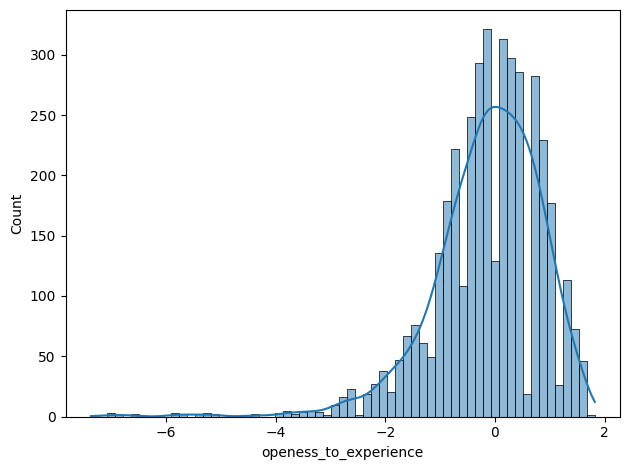

In [47]:
t=1
for i in scores:
    sns.histplot(df[i],kde=True)
    t+=1
    plt.tight_layout()
    plt.show()

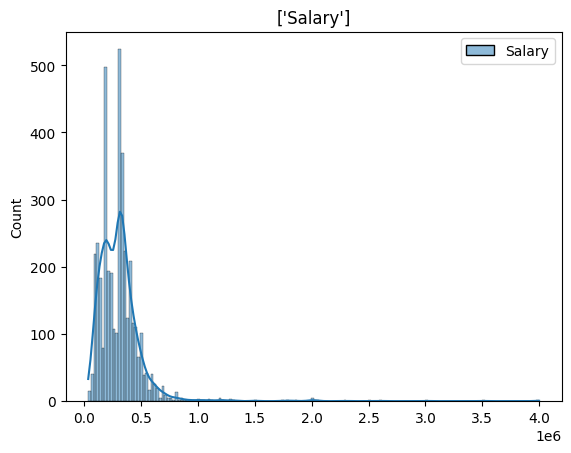

In [48]:
sns.histplot(df[y],kde=True)
plt.title(y)
plt.show()

#### Count plot

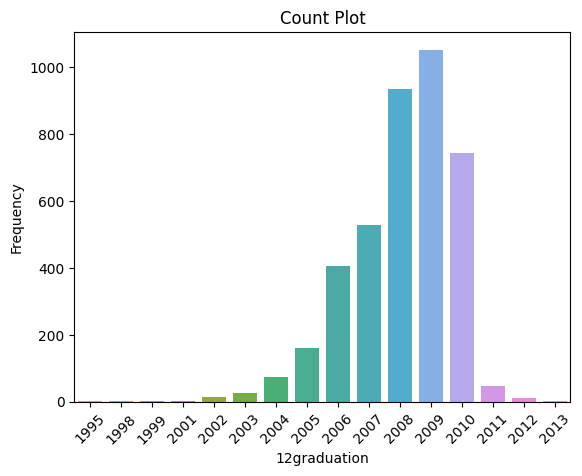

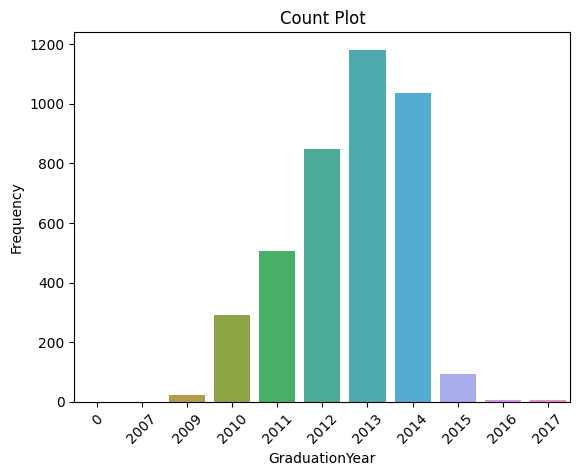

In [49]:
for i in grad_year:
    sns.countplot(data=df,x=i)
    plt.xlabel(i)
    plt.xticks(rotation=45)
    plt.ylabel('Frequency')
    plt.title('Count Plot')
    plt.show()

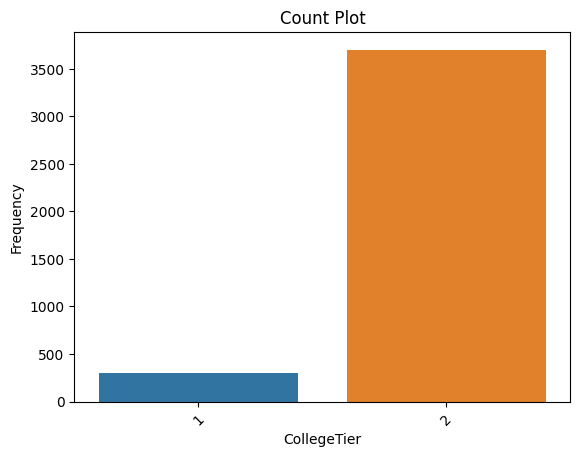

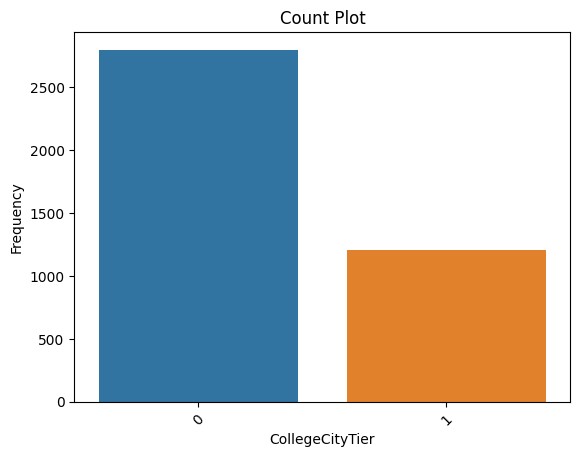

In [50]:
for i in tier:
    sns.countplot(data=df,x=i)
    plt.xlabel(i)
    plt.xticks(rotation=45)
    plt.ylabel('Frequency')
    plt.title('Count Plot')
    plt.show()

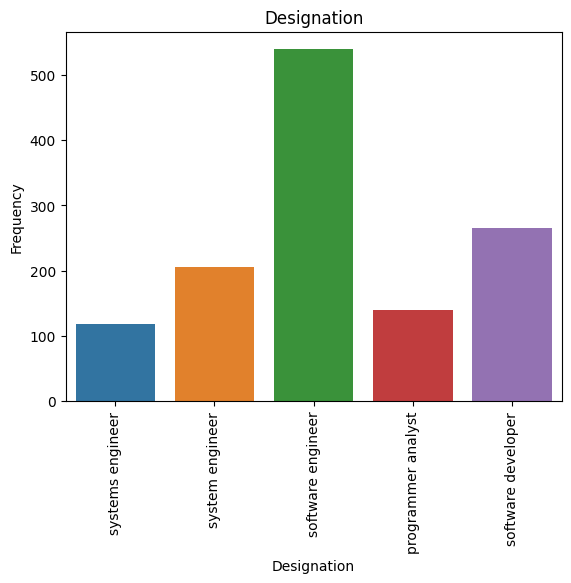

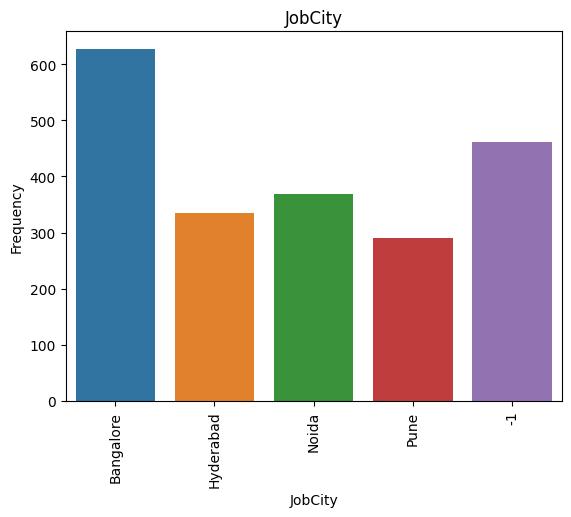

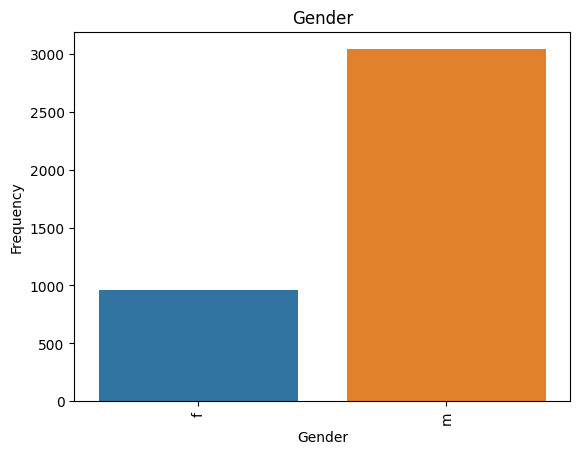

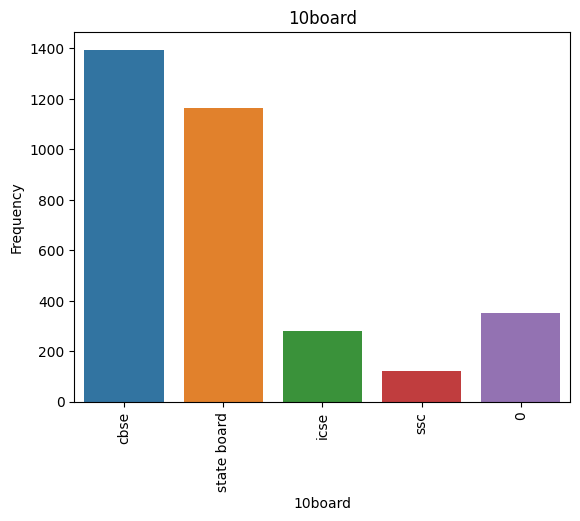

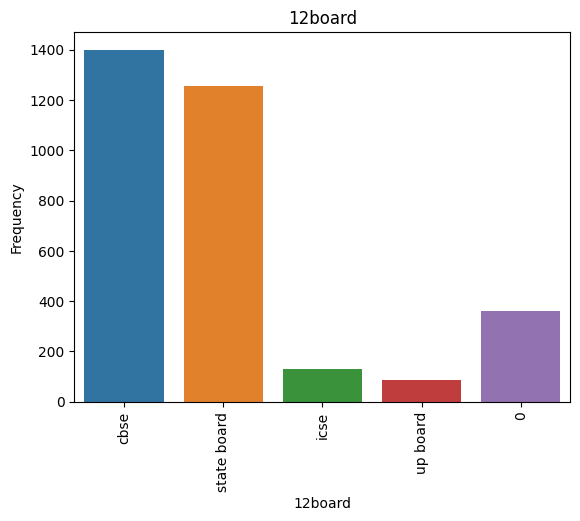

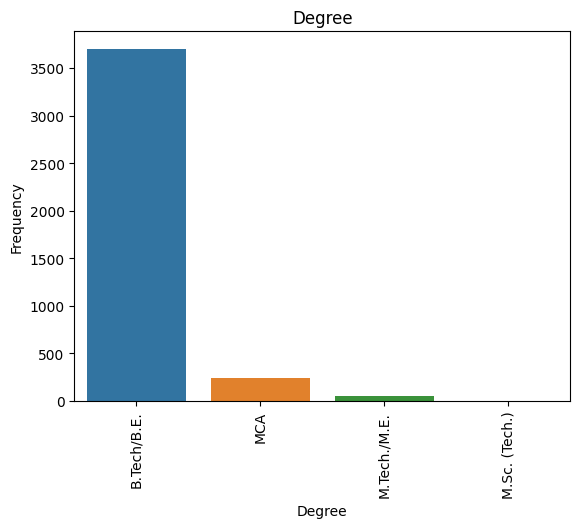

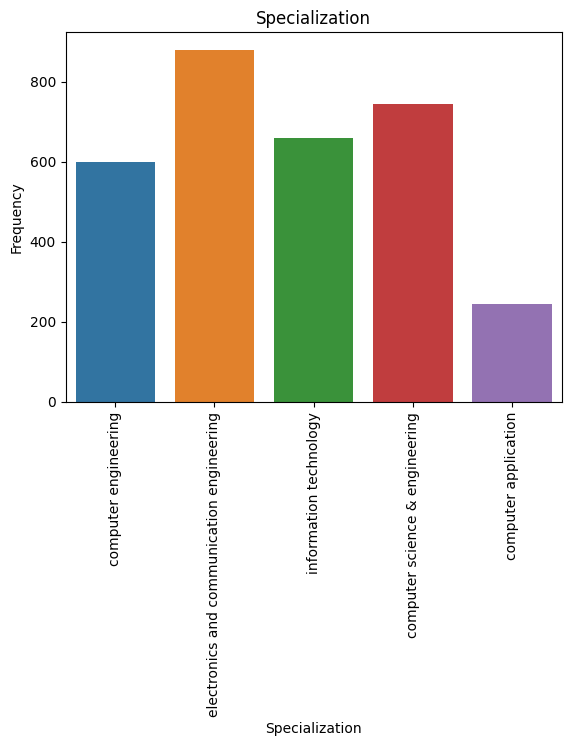

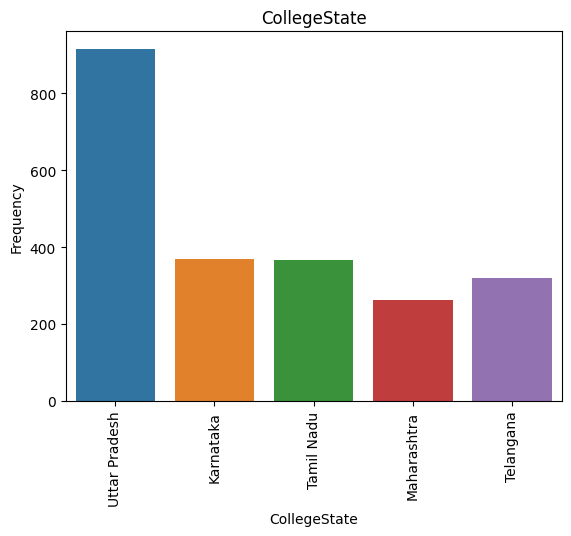

In [51]:
for i in cat_col:
    top_5 = df[i].value_counts().nlargest(5).index
    top_5 = df[df[i].isin(top_5)]
    sns.countplot(data=top_5,x=i)
    plt.xticks(rotation=90)
    plt.ylabel('Frequency')
    plt.title(i)
    plt.show()

### Bivariate Analysis

#### Numerical vs Numerical

#### Correlation

In [52]:
df.corr()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.000000,-0.247294,0.044547,0.673102,0.007069,0.284540,0.035160,0.047144,0.284540,-0.035977,...,0.482626,-0.026147,0.104454,-0.049272,-0.017871,0.175557,0.024837,0.120979,-0.146289,0.031359
Salary,-0.247294,1.000000,0.177373,-0.161383,0.170254,-0.118690,-0.179332,0.130103,-0.118690,0.015384,...,-0.100720,0.018475,-0.047598,-0.022691,0.037639,-0.064148,0.057423,-0.010213,-0.054685,-0.011312
10percentage,0.044547,0.177373,1.000000,0.269957,0.643378,0.021082,-0.126042,0.312538,0.021082,0.116707,...,-0.018933,0.050364,0.074419,0.049378,0.030002,0.067657,0.136645,-0.004679,-0.132496,0.036692
12graduation,0.673102,-0.161383,0.269957,1.000000,0.259166,0.254021,0.027691,0.086001,0.254021,-0.003016,...,0.293439,0.035459,0.123751,0.023470,-0.004727,0.103329,0.041182,0.061956,-0.074369,-0.015069
12percentage,0.007069,0.170254,0.643378,0.259166,1.000000,0.022336,-0.100771,0.346137,0.022336,0.130462,...,-0.043534,0.037635,0.064001,0.044201,0.005910,0.058299,0.103998,-0.007486,-0.094369,0.006332
CollegeID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeTier,0.035160,-0.179332,-0.126042,0.027691,-0.100771,0.067054,1.000000,-0.086781,0.067054,-0.101494,...,0.001053,-0.021548,0.002594,0.000007,-0.033722,0.055174,-0.038055,0.009970,0.023778,-0.019179
collegeGPA,0.047144,0.130103,0.312538,0.086001,0.346137,0.017240,-0.086781,1.000000,0.017240,0.017471,...,0.007601,-0.031765,0.052258,-0.005226,-0.018950,0.069582,0.068282,-0.032684,-0.074859,0.028071
CollegeCityID,0.284540,-0.118690,0.021082,0.254021,0.022336,1.000000,0.067054,0.017240,1.000000,0.007757,...,0.102303,-0.009291,0.022933,0.025620,0.005749,0.076432,-0.005264,0.005917,-0.008973,-0.010678
CollegeCityTier,-0.035977,0.015384,0.116707,-0.003016,0.130462,0.007757,-0.101494,0.017471,0.007757,1.000000,...,-0.010643,-0.052395,0.010311,0.049876,-0.033392,0.014763,0.005565,-0.008203,0.004442,-0.016790


#### Covariance

In [53]:
df.cov()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,1.319275e+11,-1.910842e+10,159378.051803,404276.838583,28243.078928,4.963137e+08,3349.438212,139854.366484,4.963137e+08,-5991.252230,...,3.072515e+07,-931869.041883,3.322958e+06,-1.876479e+06,-237952.207851,65593.400265,8496.058635,41809.257150,-53537.564434,11482.092235
Salary,-1.910842e+10,4.525724e+10,371684.456159,-56771.565543,398412.208861,-1.212565e+08,-10005.790486,226052.995923,-1.212565e+08,1500.495432,...,-3.755551e+06,385652.660706,-8.868903e+05,-5.061435e+05,293530.550489,-14037.983625,11504.821563,-2067.186195,-11721.817357,-2425.975501
10percentage,1.593781e+05,3.716845e+05,97.025700,4.397119,69.710710,9.972611e+02,-0.325618,25.143547,9.972611e+02,0.527071,...,-3.268791e+01,48.678119,6.420377e+01,5.099856e+01,10.833465,0.685534,1.267615,-0.043855,-1.314998,0.364343
12graduation,4.042768e+05,-5.677157e+04,4.397119,2.734391,4.714096,2.017185e+03,0.012009,1.161489,2.017185e+03,-0.002287,...,8.504783e+01,5.753526,1.792305e+01,4.069324e+00,-0.286551,0.175763,0.064135,0.097479,-0.123908,-0.025119
12percentage,2.824308e+04,3.984122e+05,69.710710,4.714096,120.998528,1.179912e+03,-0.290720,31.096999,1.179912e+03,0.657967,...,-8.393252e+01,40.621034,6.166074e+01,5.098068e+01,2.383094,0.659664,1.077373,-0.078347,-1.045919,0.070213
CollegeID,4.963137e+08,-1.212565e+08,997.261052,2017.184639,1179.911862,2.306172e+07,84.454309,676.167910,2.306172e+07,17.079669,...,8.610934e+04,-4378.244435,9.645816e+03,1.290070e+04,1012.081362,377.568165,-23.806085,27.034147,-43.417151,-51.690285
CollegeTier,3.349438e+03,-1.000579e+04,-0.325618,0.012009,-0.290720,8.445431e+01,0.068786,-0.185889,8.445431e+01,-0.012204,...,4.840737e-02,-0.554542,5.959109e-02,1.999373e-04,-0.324218,0.014885,-0.009400,0.002488,0.006284,-0.005071
collegeGPA,1.398544e+05,2.260530e+05,25.143547,1.161489,31.096999,6.761679e+02,-0.185889,66.705404,6.761679e+02,0.065421,...,1.088097e+01,-25.456707,3.738237e+01,-4.475103e+00,-5.673773,0.584587,0.525213,-0.253988,-0.616035,0.231115
CollegeCityID,4.963137e+08,-1.212565e+08,997.261052,2017.184639,1179.911862,2.306172e+07,84.454309,676.167910,2.306172e+07,17.079669,...,8.610934e+04,-4378.244435,9.645816e+03,1.290070e+04,1012.081362,377.568165,-23.806085,27.034147,-43.417151,-51.690285
CollegeCityTier,-5.991252e+03,1.500495e+03,0.527071,-0.002287,0.657967,1.707967e+01,-0.012204,0.065421,1.707967e+01,0.210212,...,-8.552884e-01,-2.357183,4.140691e-01,2.397733e+00,-0.561244,0.006963,0.002403,-0.003578,0.002052,-0.007760


### Plots

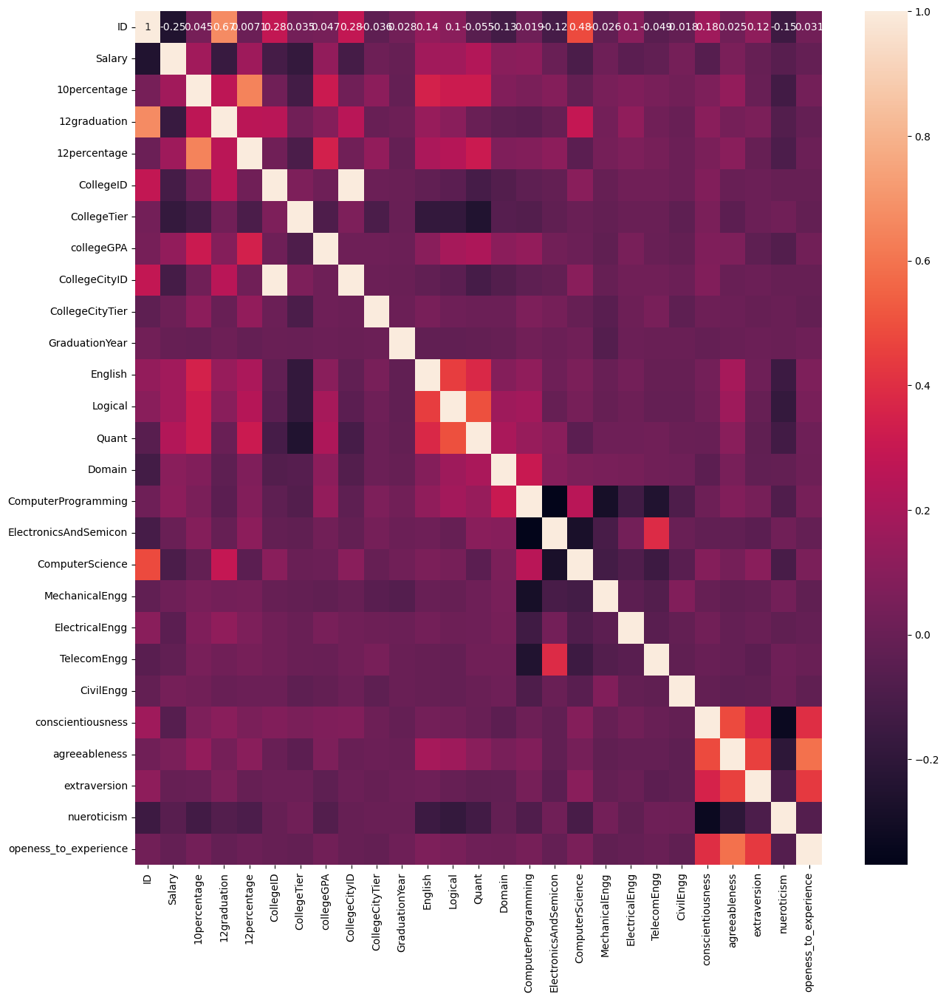

In [54]:
plt.figure(figsize=[15,15])
sns.heatmap(df.corr(),annot=True)
plt.show()

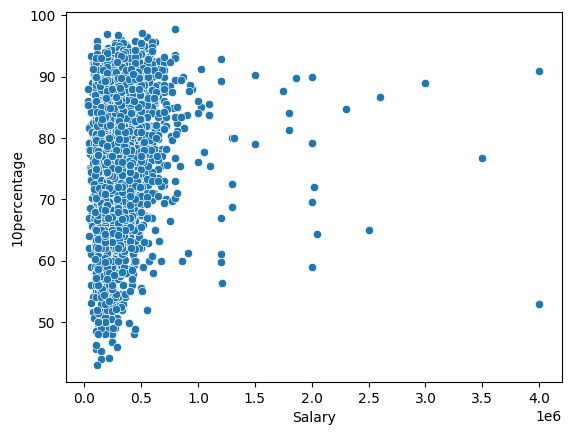

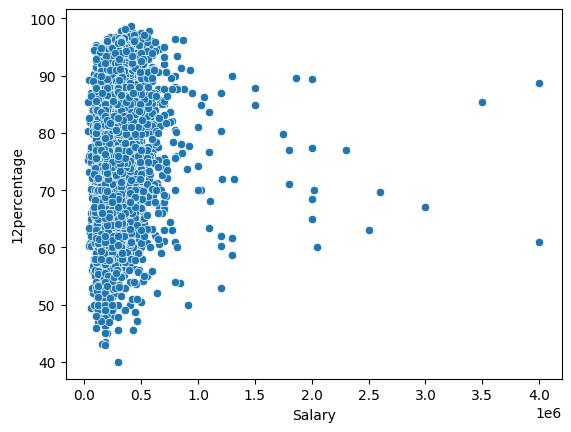

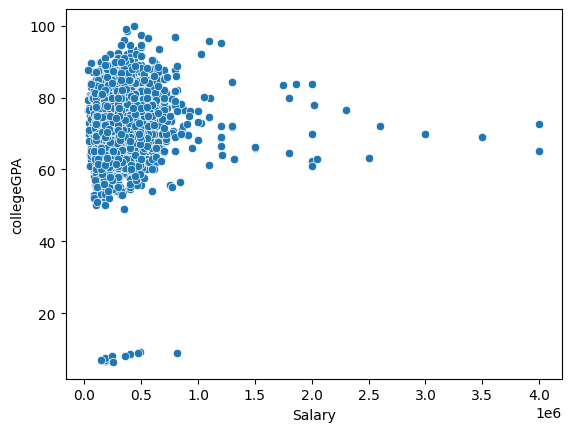

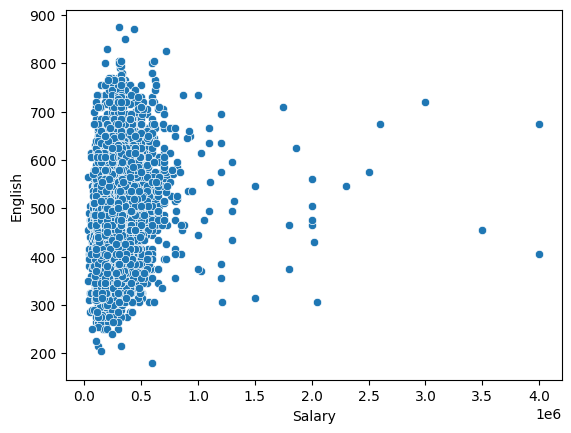

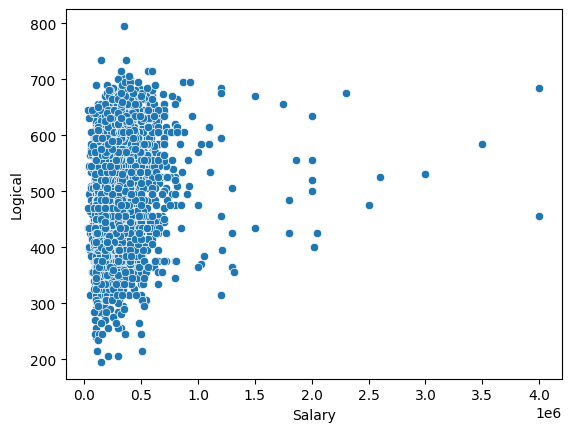

...

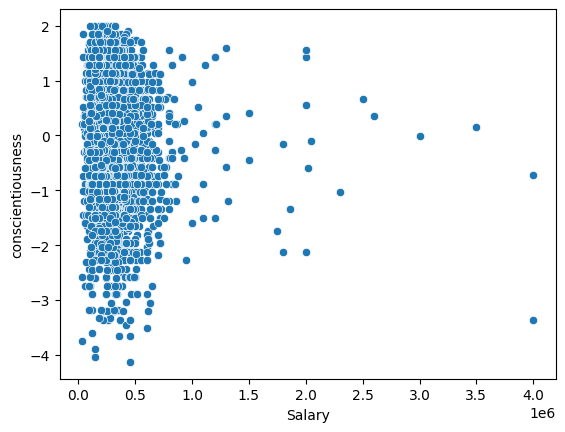

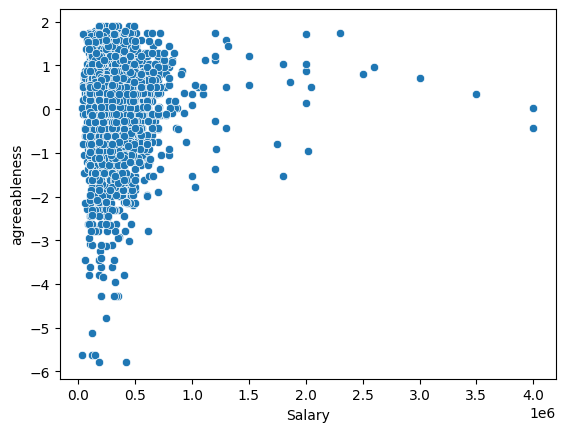

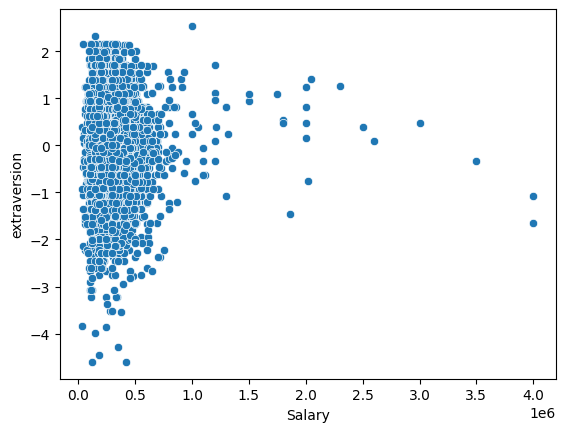

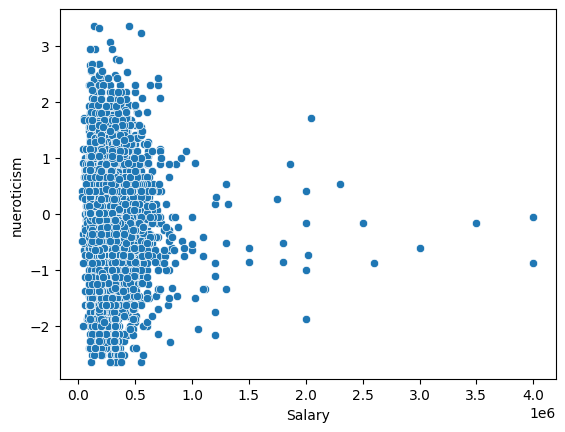

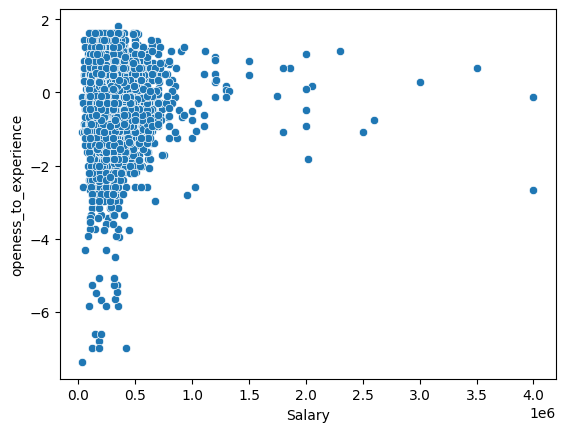

In [55]:
for i in y:
    for j in scores:
        sns.scatterplot(data=df,x=i,y=j)
        plt.show()

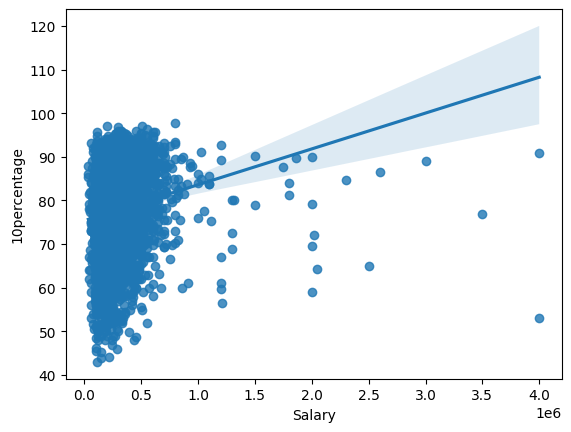

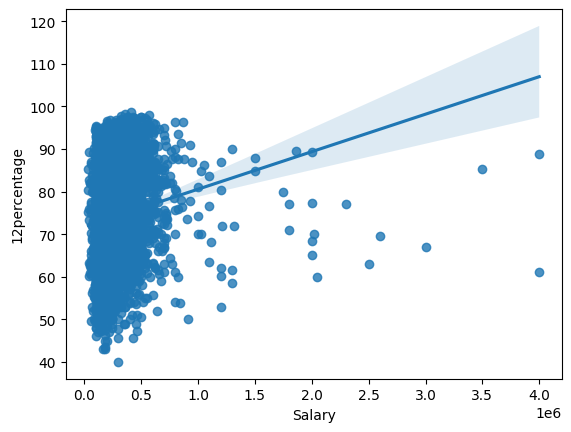

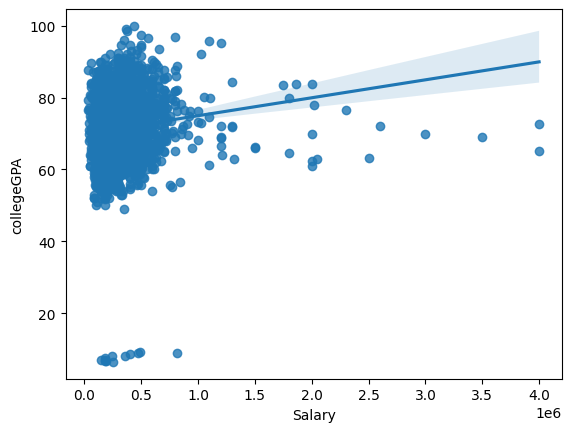

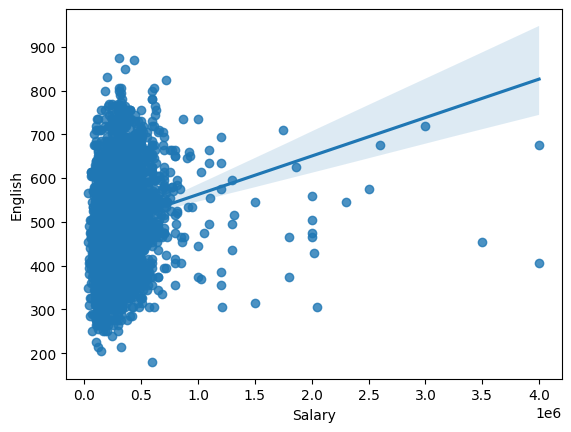

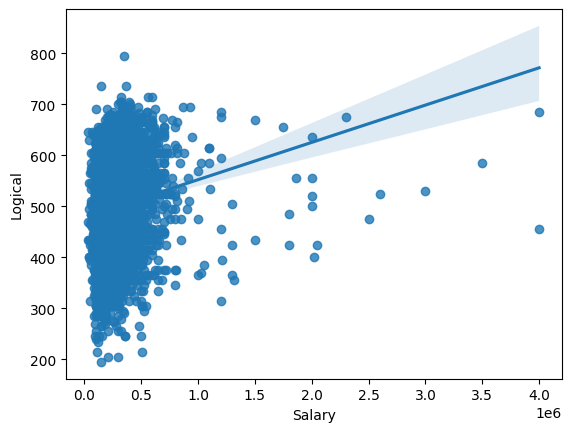

...

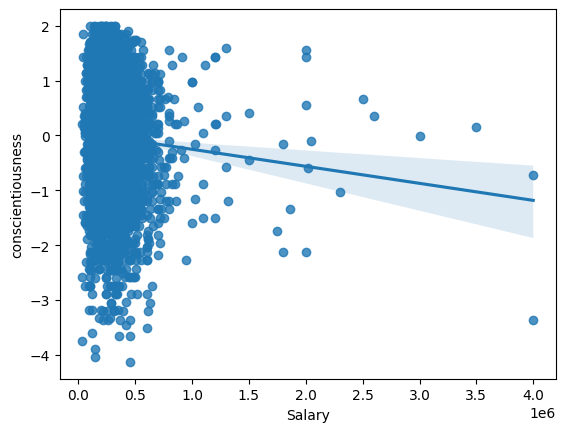

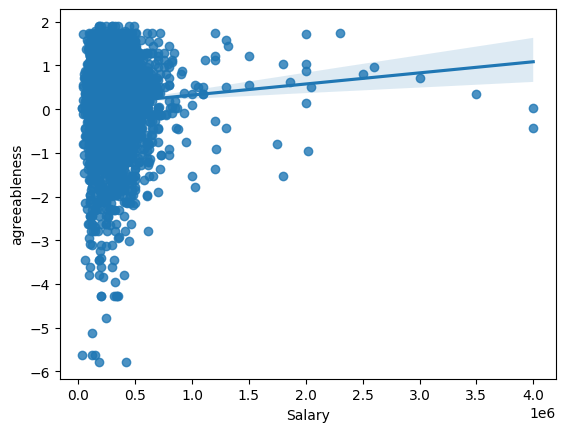

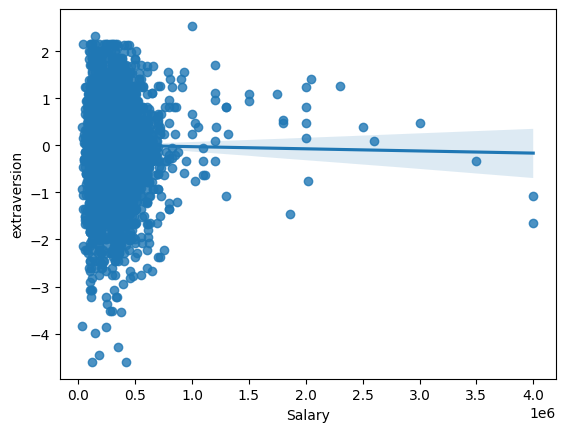

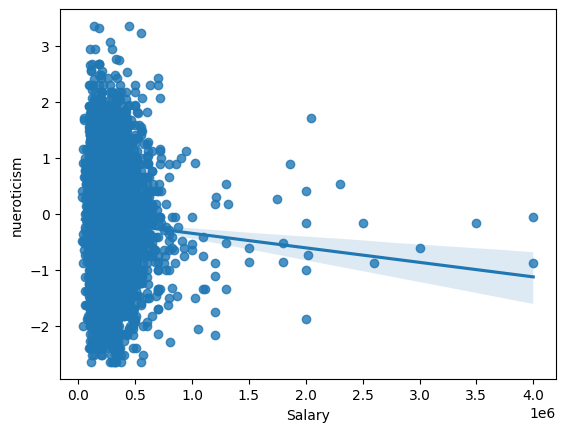

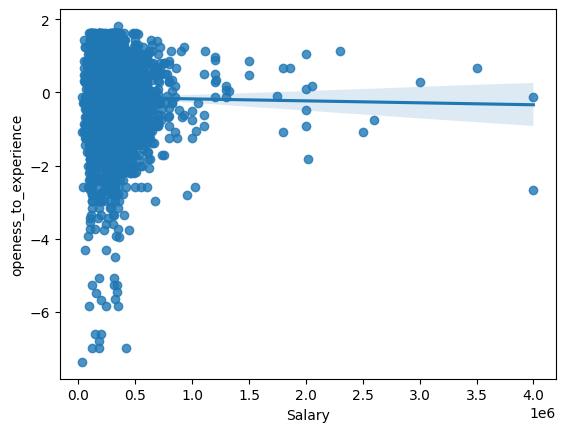

In [56]:
for i in y:
    for j in scores:
        sns.regplot(data=df,x=i,y=j)
        plt.show()

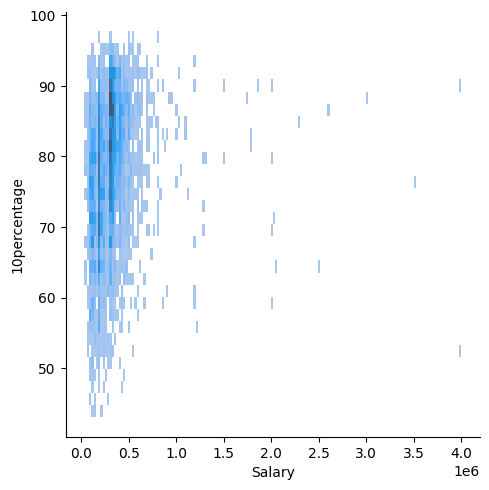

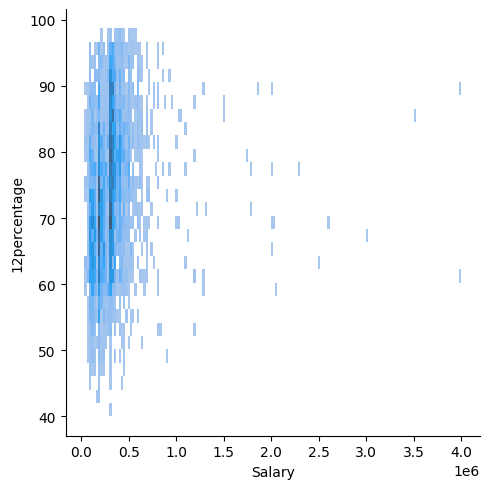

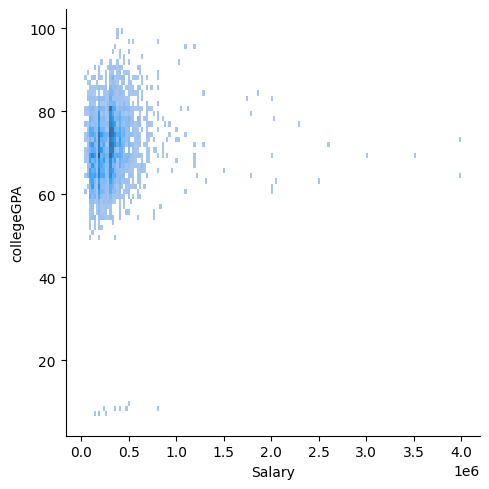

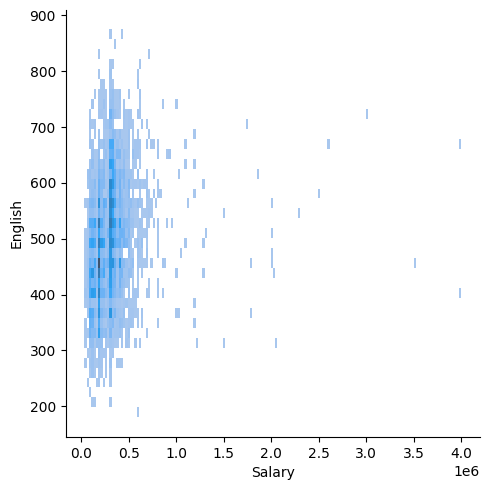

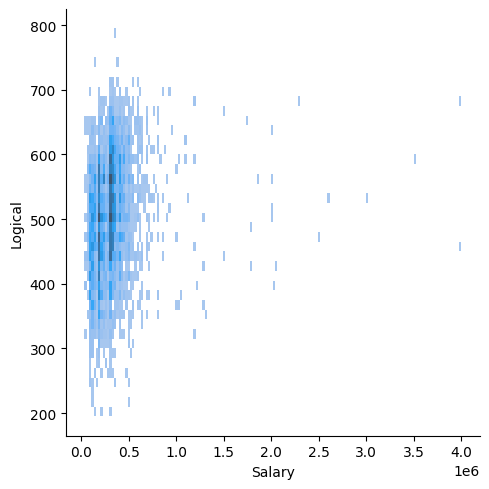

...

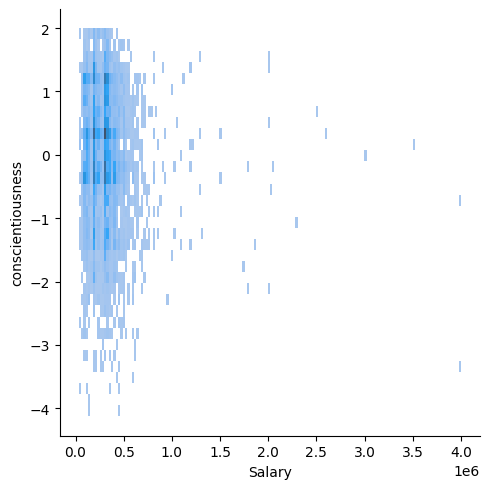

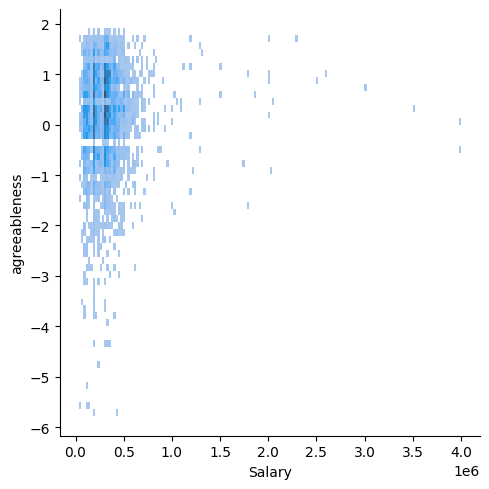

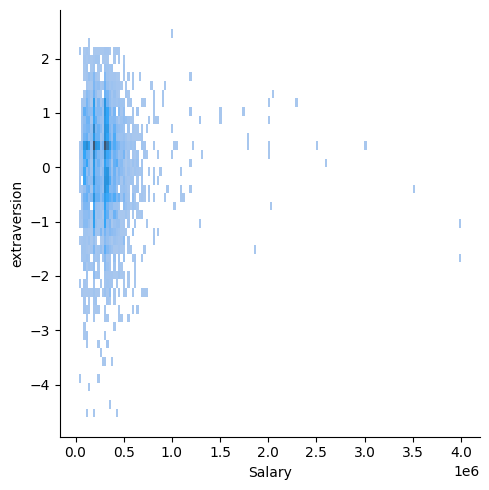

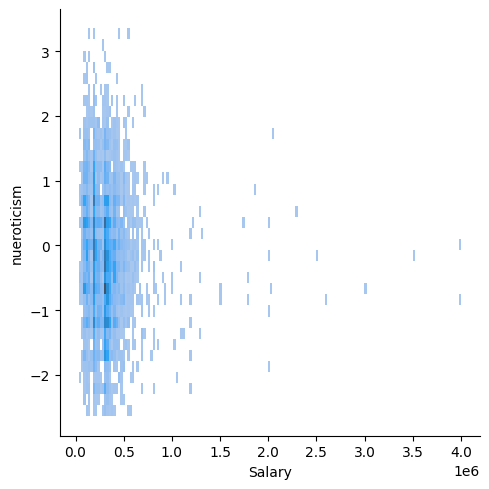

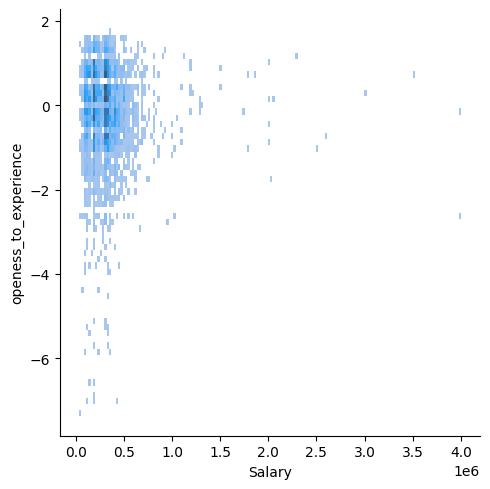

In [57]:
for i in y:
    for j in scores:
        sns.displot(data=df,x=i,y=j)
        plt.show()

### Numerical vs Categorical

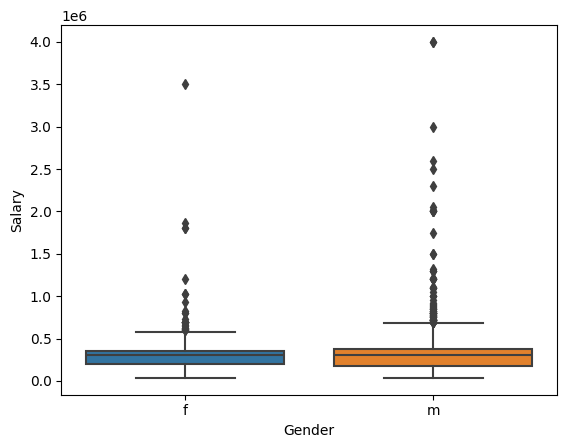

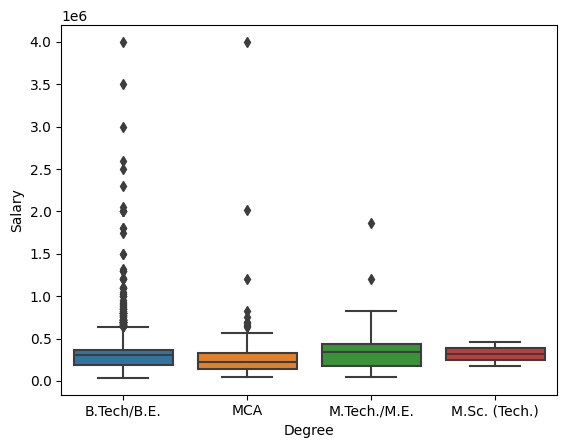

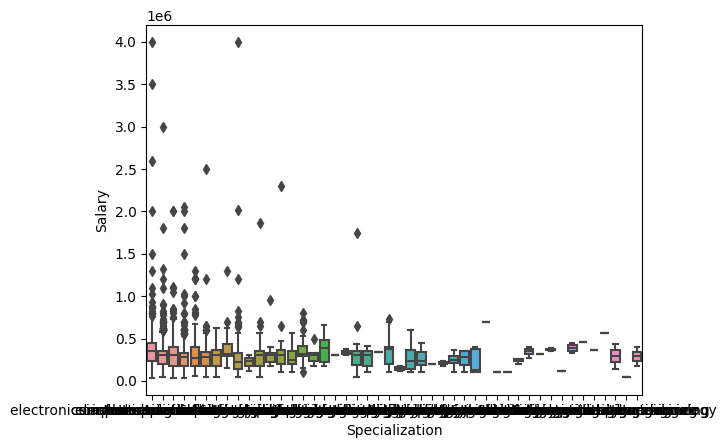

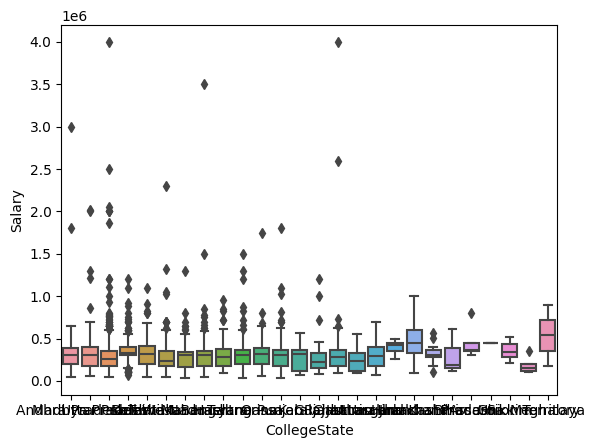

In [58]:
less_cat_col = ['Gender', 'Degree', 'Specialization', 'CollegeState']
for i in y:
    for j in less_cat_col:
        sns.boxplot(x=j,y=i,data=df)
        plt.show()

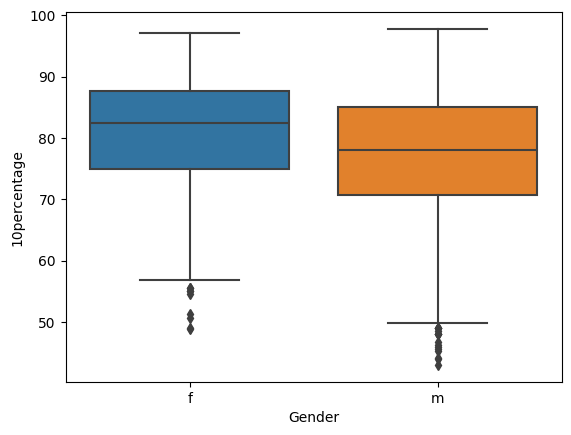

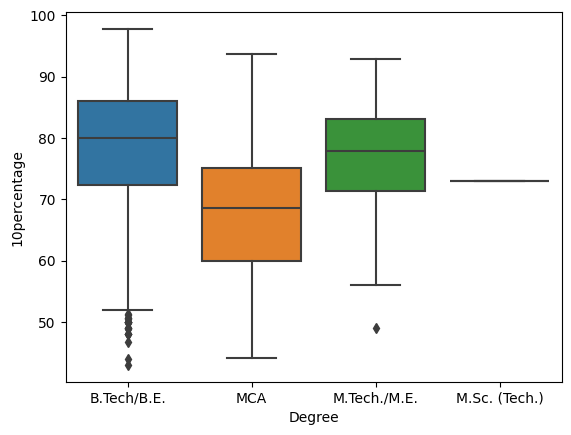

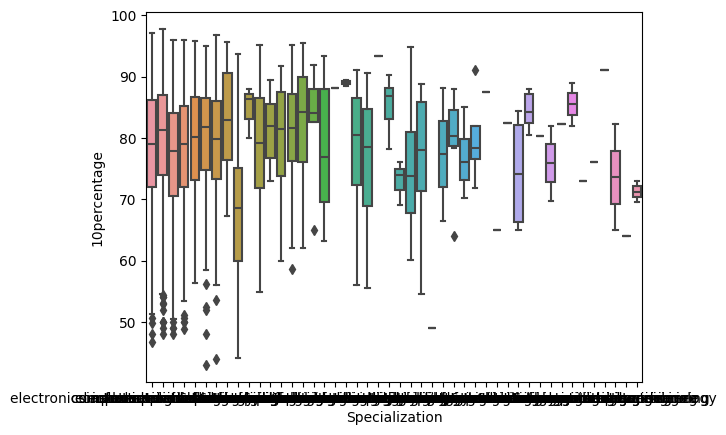

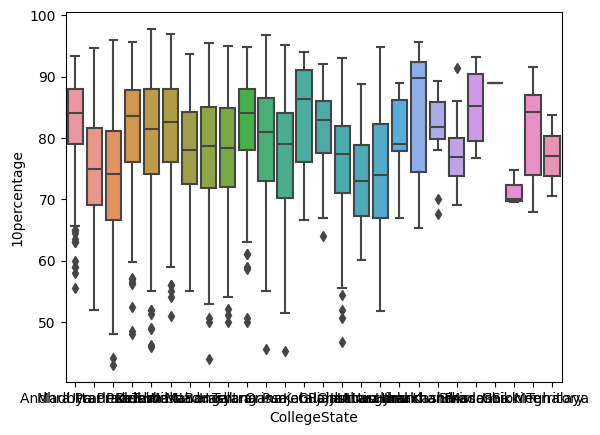

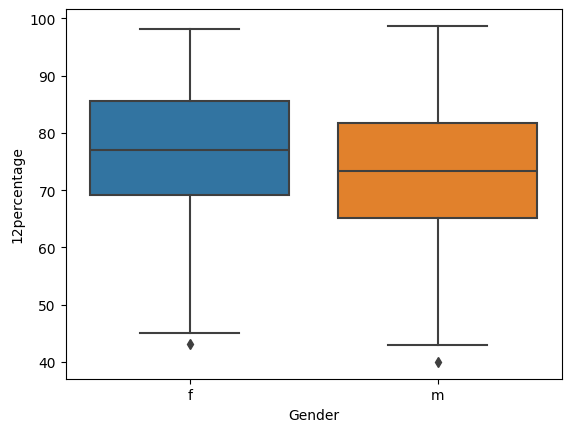

...

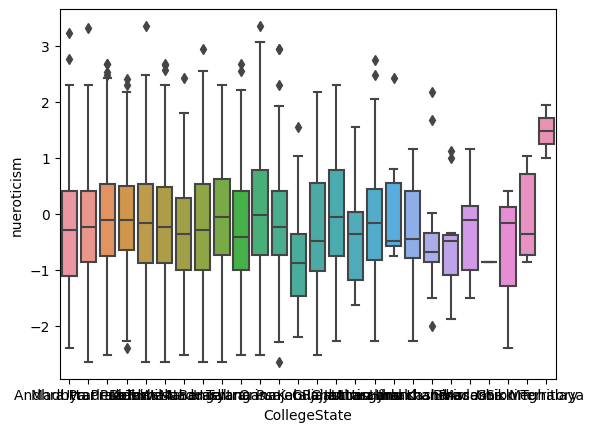

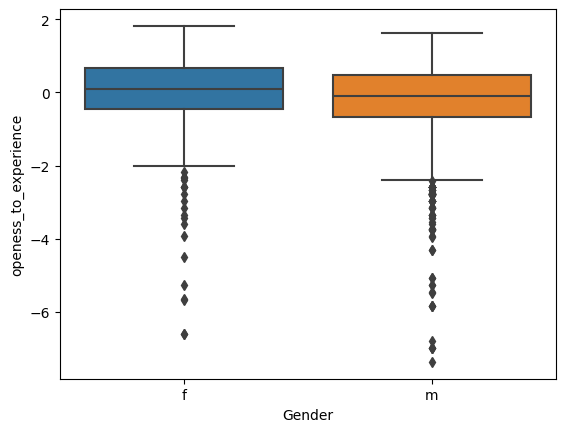

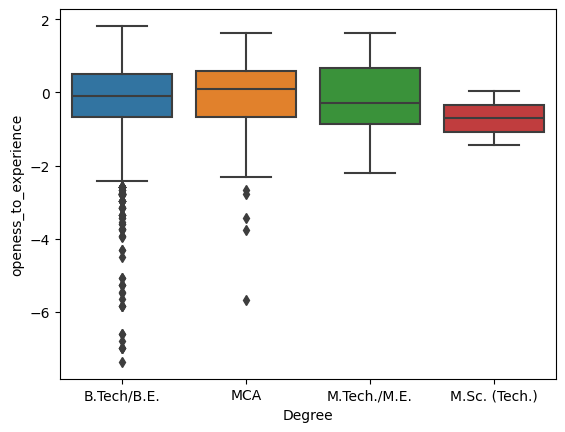

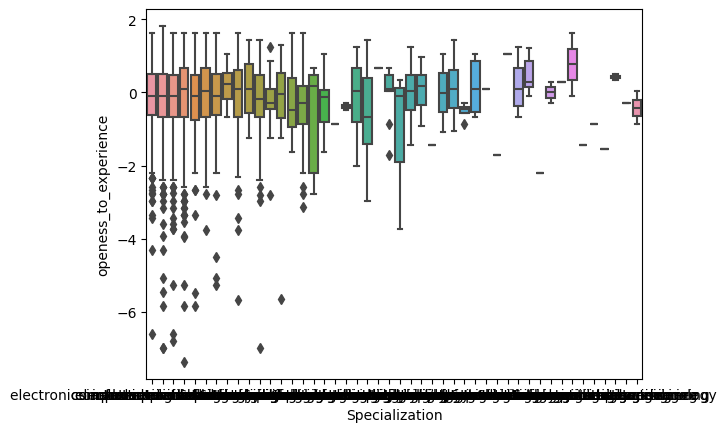

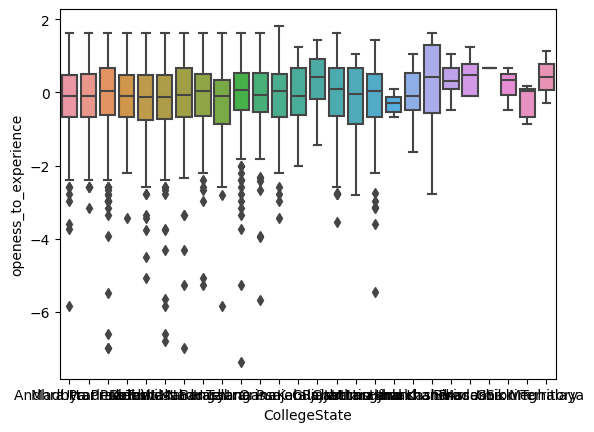

In [59]:
less_cat_col = ['Gender', 'Degree', 'Specialization', 'CollegeState']
for i in scores:
    for j in less_cat_col:
        sns.boxplot(x=j,y=i,data=df)
        plt.show()

### Categorical vs Categorical

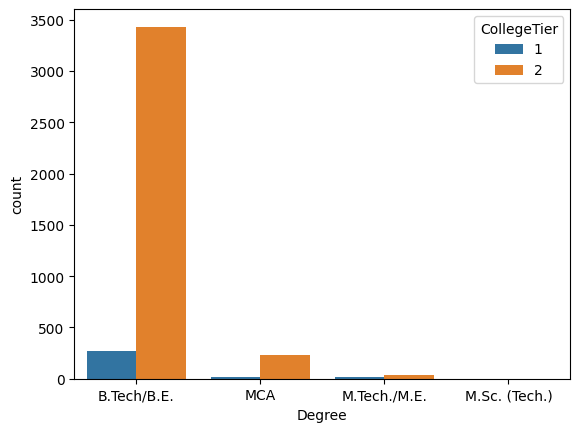

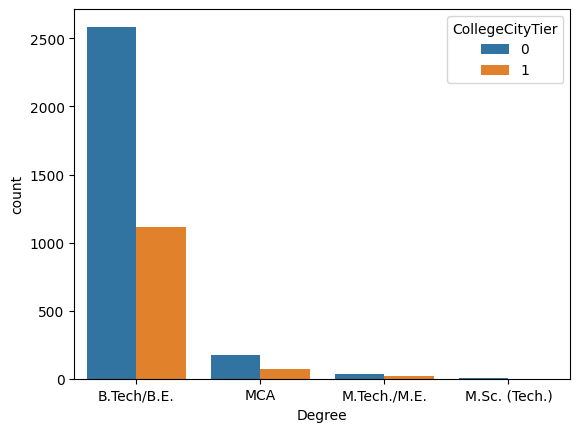

In [60]:
for i in tier:
    sns.countplot(x='Degree',hue=i,data=df)
    plt.show()

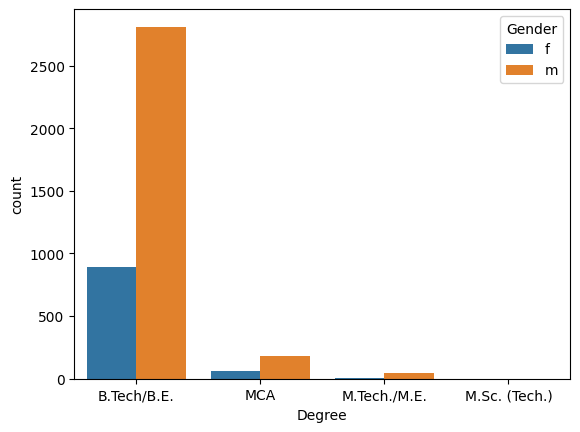

In [61]:
sns.countplot(x='Degree',hue='Gender',data=df)
plt.show()

<Figure size 3000x3000 with 0 Axes>

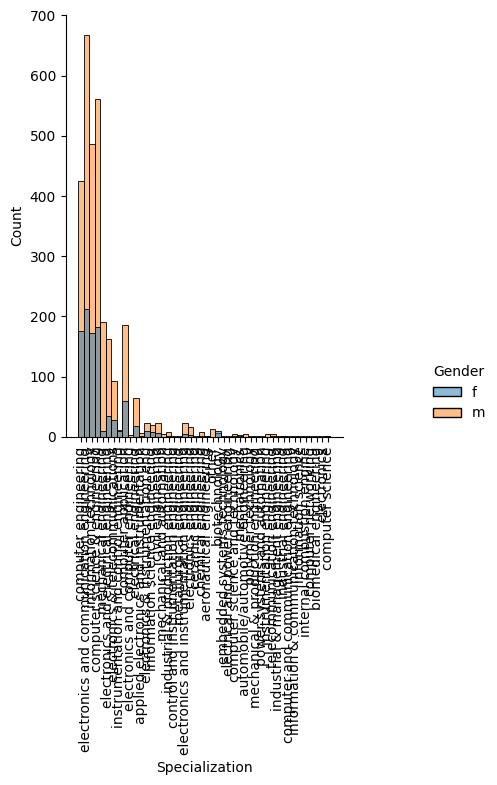

In [62]:
plt.figure(figsize=[30,30])
sns.displot(x='Specialization',hue='Gender',data=df)
plt.xticks(rotation=90)
plt.show()

### Multivariate Analysis

### Salary vs Gender vs Tier

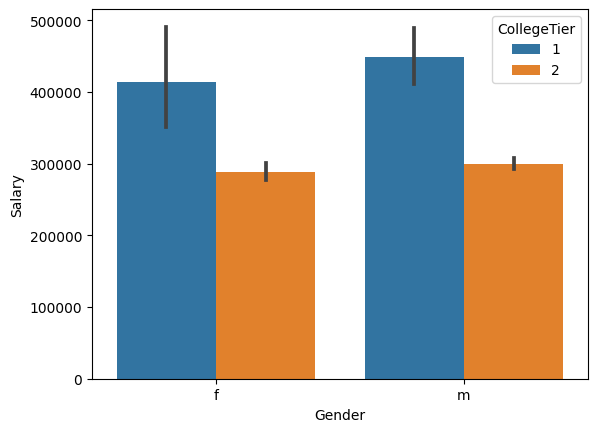

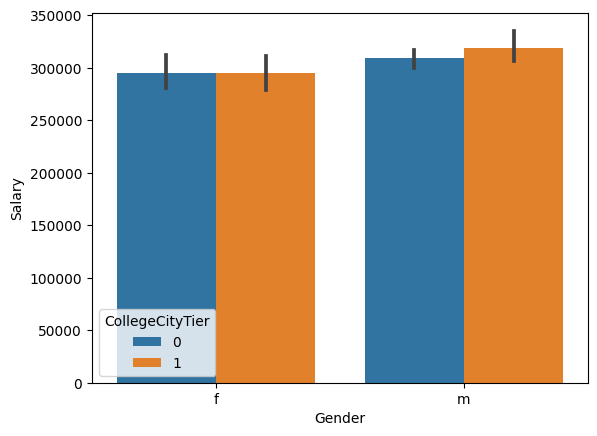

In [63]:
for i in tier:
    sns.barplot(x='Gender',y='Salary',data=df,hue=i)
    plt.show()

### Salary vs Degree vs Tier

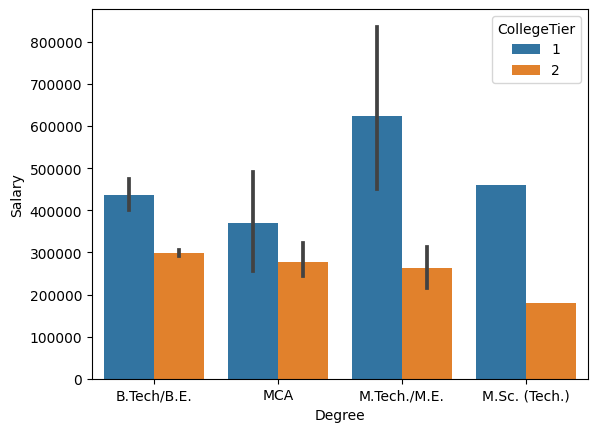

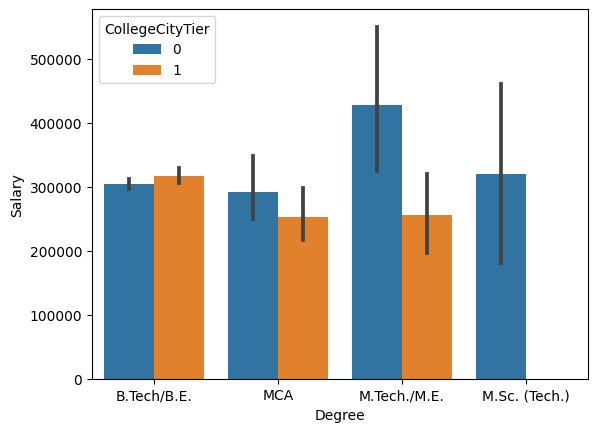

In [64]:
for i in tier:
    sns.barplot(x='Degree',y='Salary',data=df,hue=i)
    plt.show()

### Salary vs Scores vs Degree

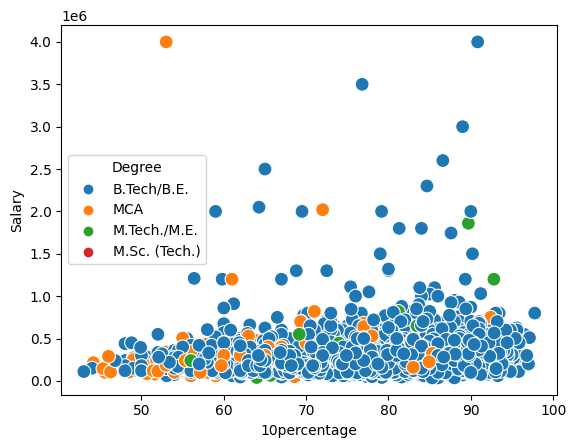

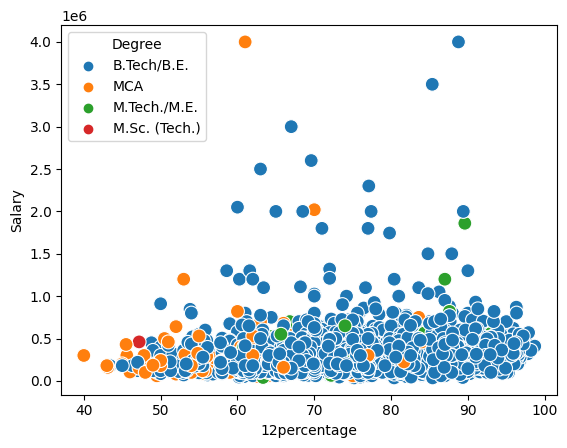

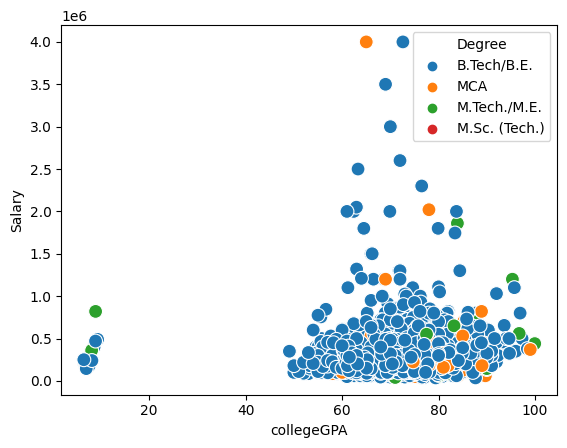

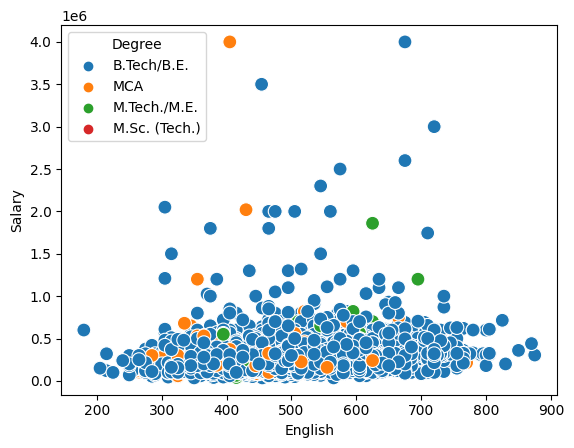

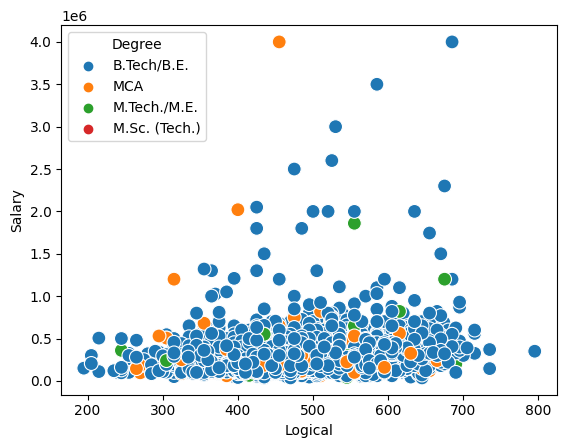

...

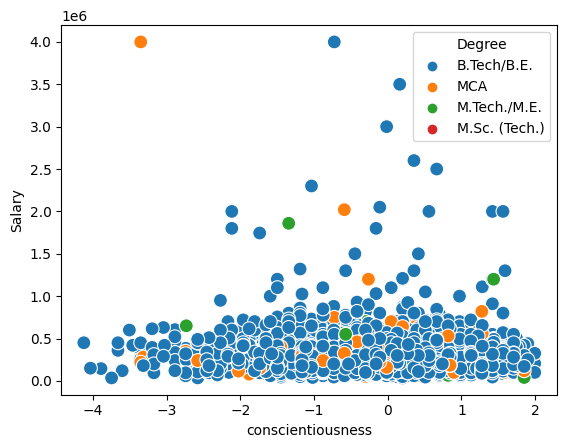

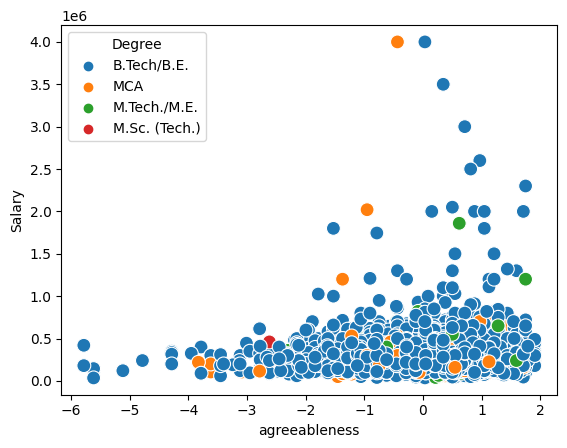

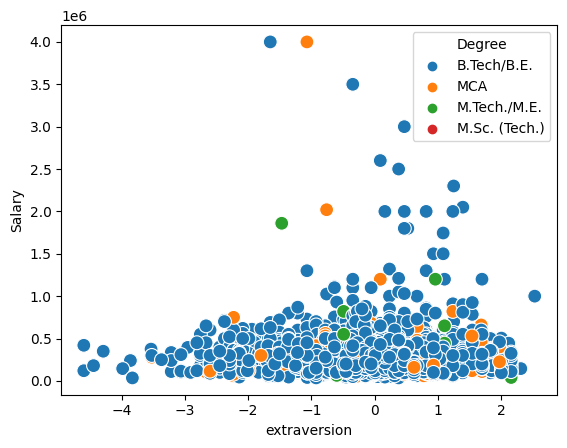

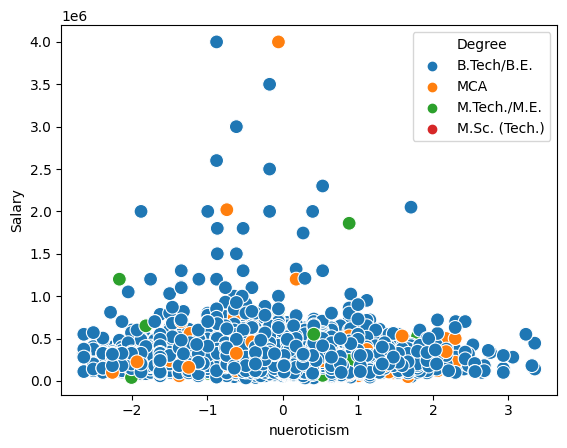

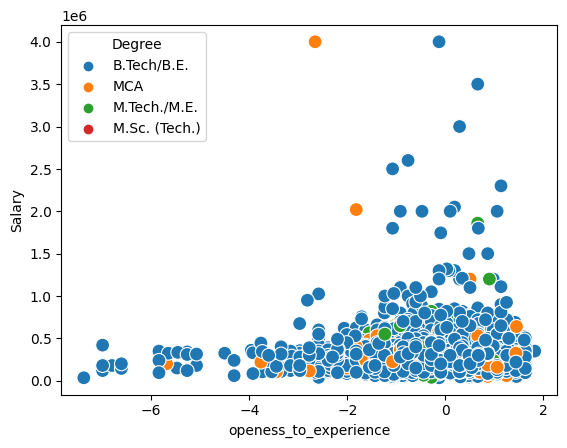

In [65]:
for i in scores:
    sns.scatterplot(x=i, y='Salary', hue='Degree', data=df, s=100)
    plt.show()

### Salary vs Scores vs Gender

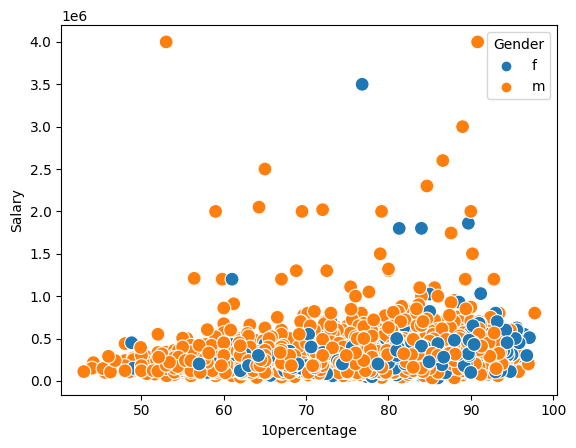

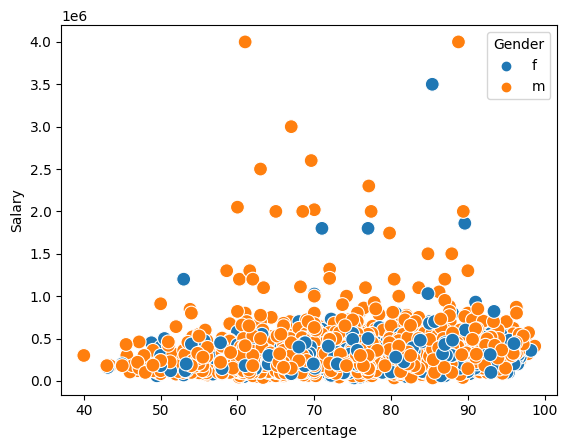

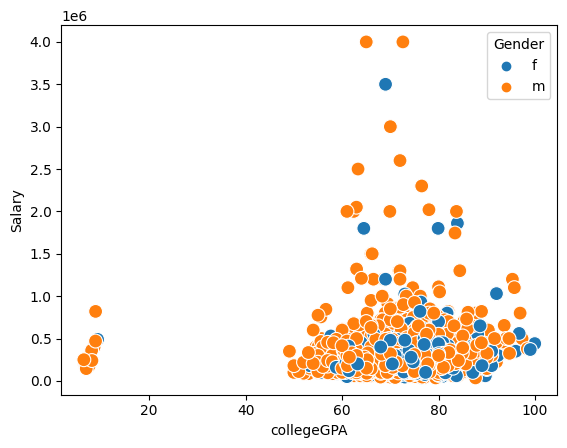

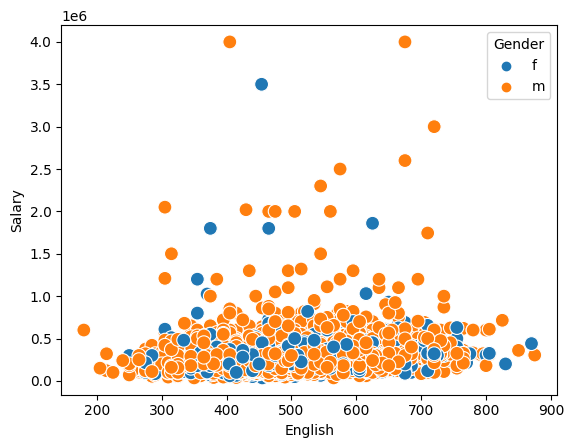

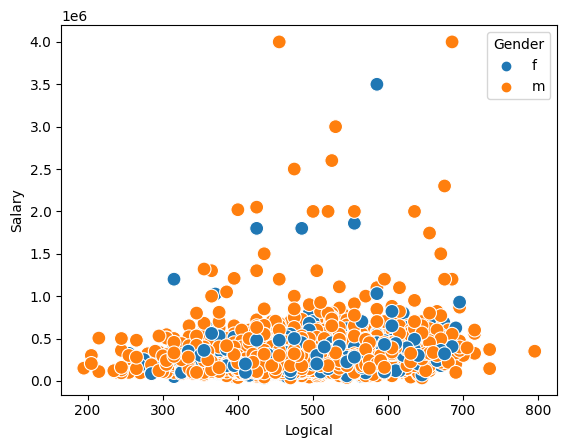

...

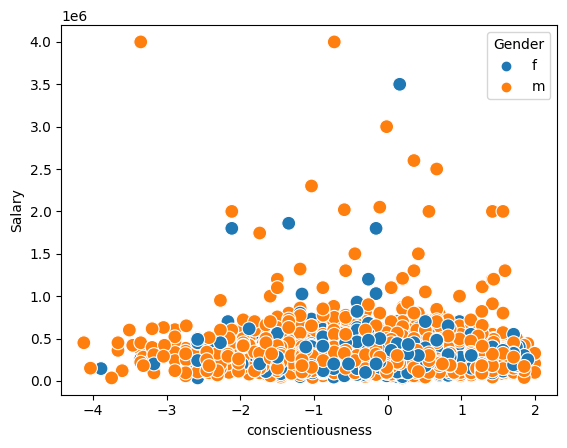

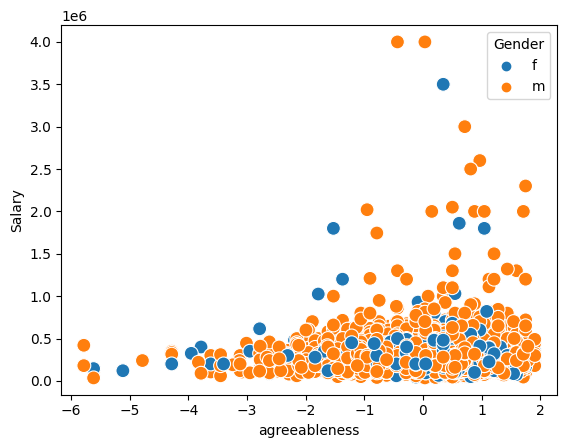

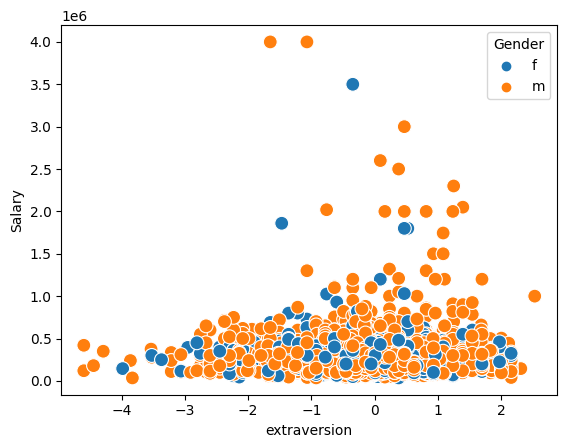

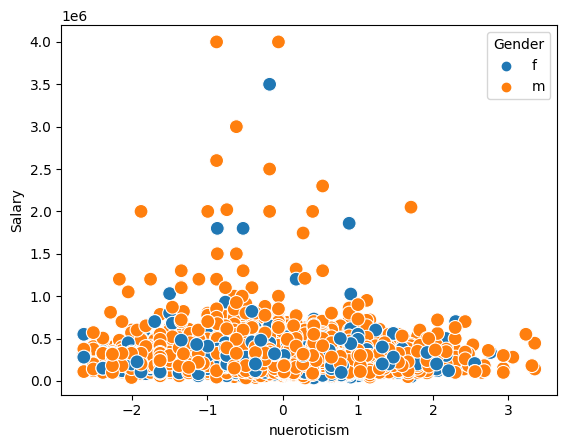

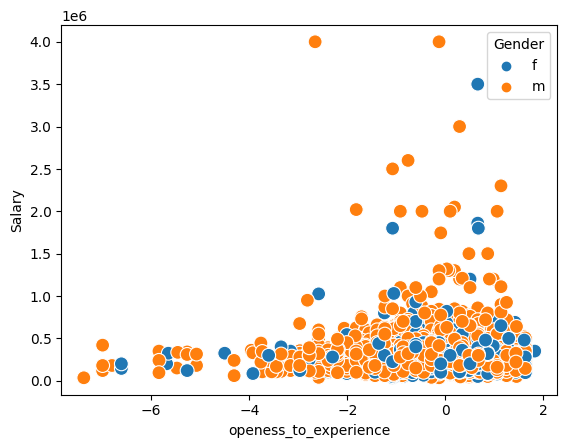

In [66]:
for i in scores:
    sns.scatterplot(x=i, y='Salary', hue='Gender', data=df, s=100)
    plt.show()

### Salary vs Scores vs CollegeState

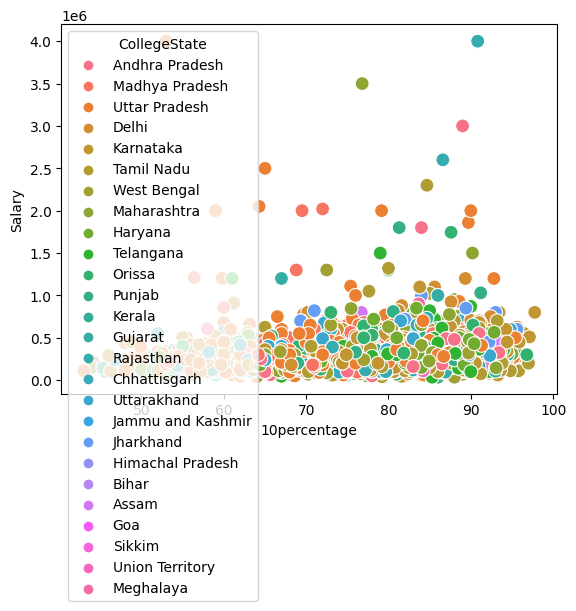

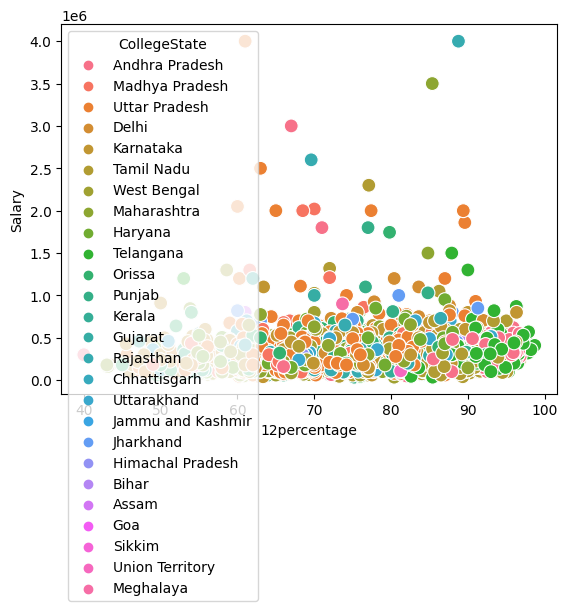

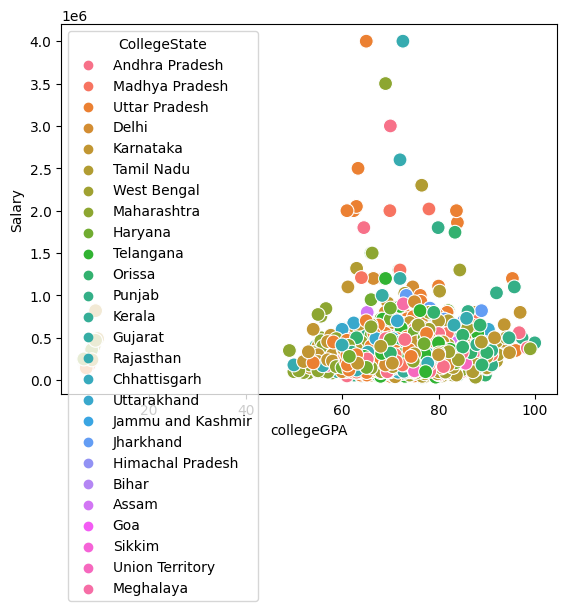

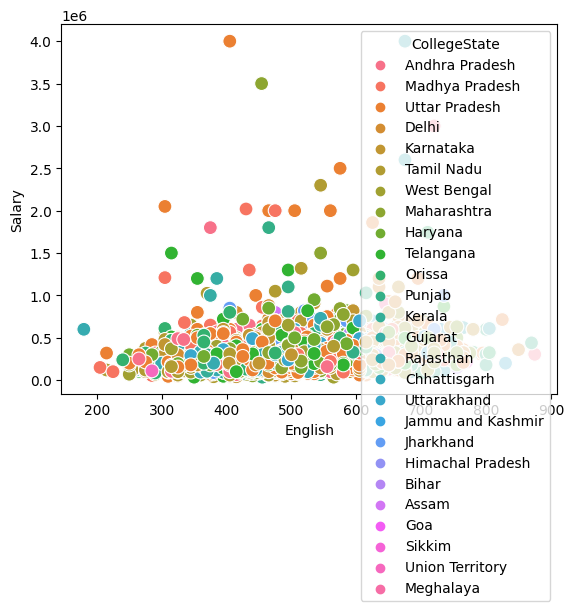

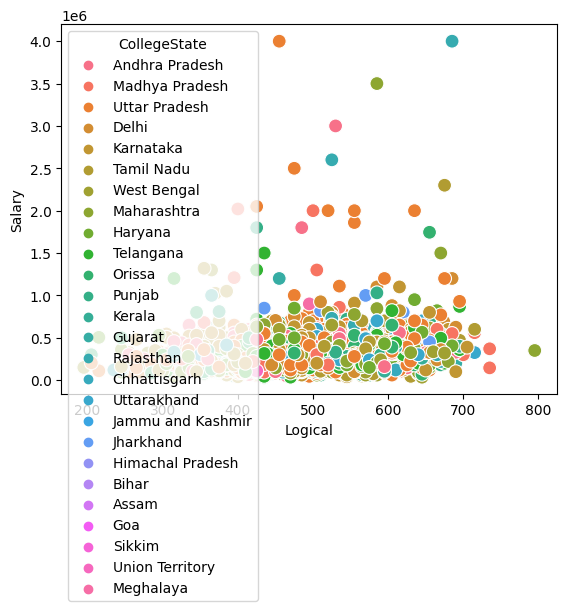

...

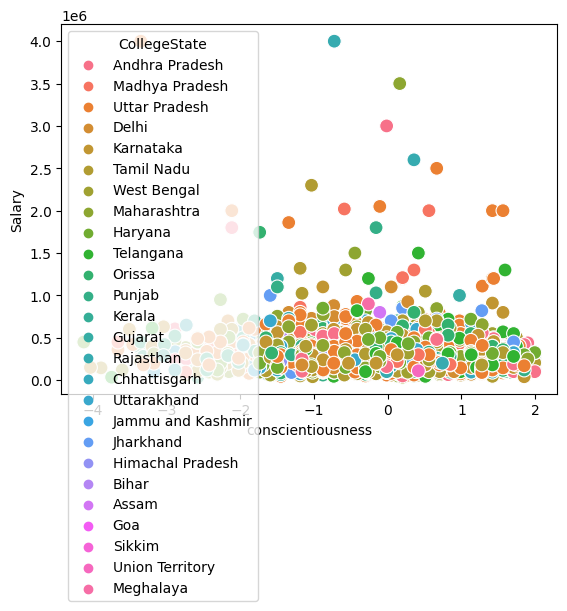

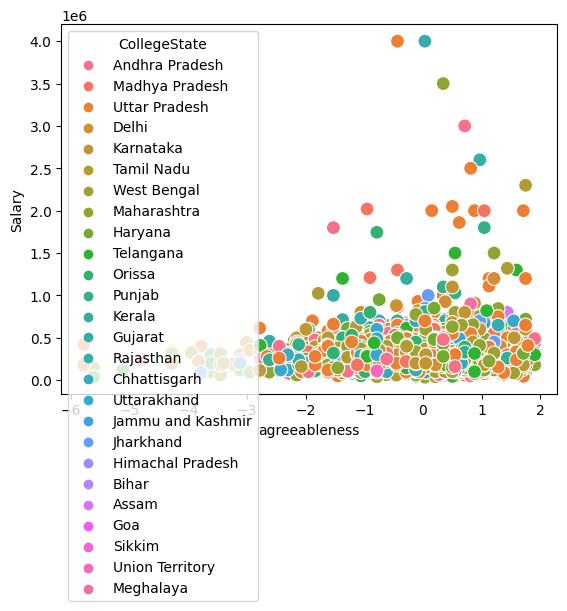

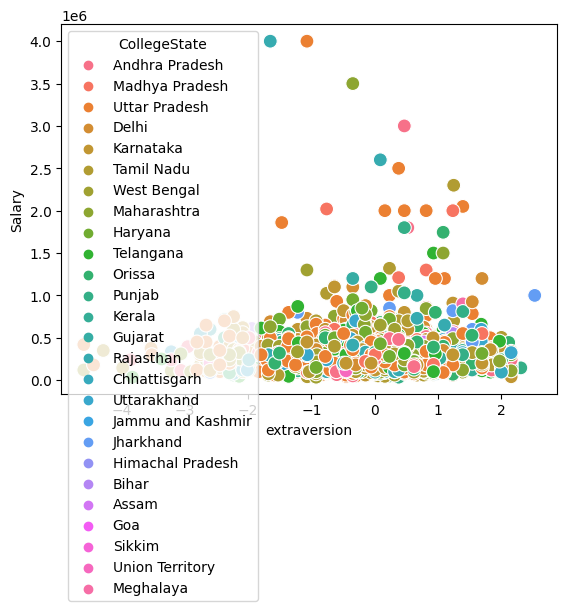

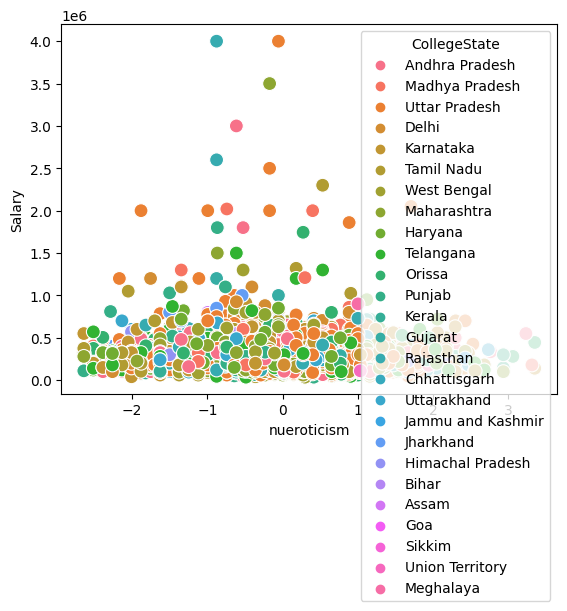

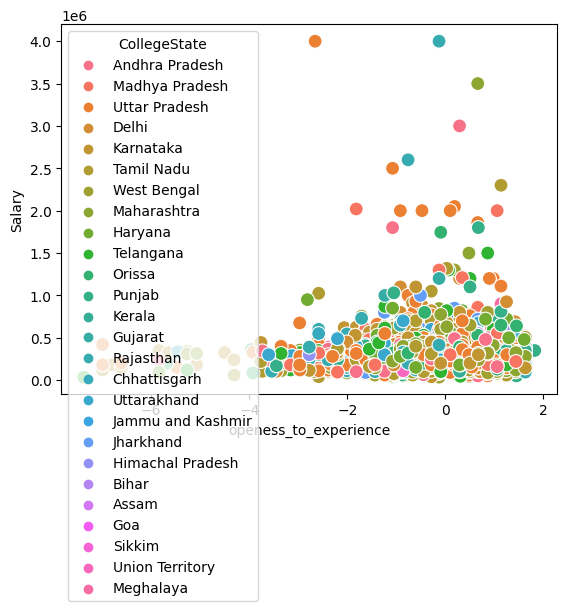

In [67]:
for i in scores:
    sns.scatterplot(x=i, y='Salary', hue='CollegeState', data=df, s=100)
    plt.show()

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     3998 non-null   int64         
 1   Salary                 3998 non-null   float64       
 2   DOJ                    3998 non-null   datetime64[ns]
 3   DOL                    3998 non-null   object        
 4   Designation            3998 non-null   object        
 5   JobCity                3998 non-null   object        
 6   Gender                 3998 non-null   object        
 7   DOB                    3998 non-null   datetime64[ns]
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   int64         
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  Col

### Analysis Questions

**1.Who is the top scorer in each subject?**

In [69]:
for i in scores:
    maxi = df[i].max()
    #print(maxi)
    out = df[['ID',i]].loc[df[i]==maxi]
    mo = df[['ID']].loc[df[i]==maxi].reset_index(drop=True)
    #print(mo)
    #print(out)
    #print()
    #print('************')
    #print(out)
    print(f'The top scorer of {i} is {mo} with {maxi} marks')

The top scorer of 10percentage is        ID
0  619705 with 97.76 marks
The top scorer of 12percentage is        ID
0  435437 with 98.7 marks
The top scorer of collegeGPA is        ID
0  609356 with 99.93 marks
The top scorer of English is         ID
0  1023622 with 875 marks
The top scorer of Logical is        ID
0  649530 with 795 marks
The top scorer of Quant is        ID
0  595163
1  510199 with 900 marks
The top scorer of Domain is         ID
0  1106060
1  1244355 with 0.9999104076 marks
The top scorer of ComputerProgramming is        ID
0  712570 with 840 marks
The top scorer of ElectronicsAndSemicon is         ID
0  1157412
1  1062520 with 612 marks
The top scorer of ComputerScience is         ID
0  1106060
1  1244355 with 715 marks
The top scorer of MechanicalEngg is         ID
0  1002611 with 623 marks
The top scorer of ElectricalEngg is        ID
0  984851 with 676 marks
The top scorer of TelecomEngg is         ID
0  1093783
1   906896 with 548 marks
The top scorer of CivilEng

**2.What is the salary of the top scorer in each specialization?**

In [70]:
for i in scores:
    maxi = df[i].max()
    mo=df[['Salary']].loc[df[i]==maxi].reset_index(drop=True)
    print(f"The top scorer of {i} {mo}")

The top scorer of 10percentage      Salary
0  800000.0
The top scorer of 12percentage      Salary
0  410000.0
The top scorer of collegeGPA      Salary
0  440000.0
The top scorer of English      Salary
0  305000.0
The top scorer of Logical      Salary
0  350000.0
The top scorer of Quant      Salary
0   80000.0
1  770000.0
The top scorer of Domain      Salary
0  310000.0
1  325000.0
The top scorer of ComputerProgramming      Salary
0  625000.0
The top scorer of ElectronicsAndSemicon      Salary
0  350000.0
1  325000.0
The top scorer of ComputerScience      Salary
0  310000.0
1  325000.0
The top scorer of MechanicalEngg      Salary
0  325000.0
The top scorer of ElectricalEngg      Salary
0  320000.0
The top scorer of TelecomEngg      Salary
0  100000.0
1  310000.0
The top scorer of CivilEngg      Salary
0  415000.0
The top scorer of conscientiousness       Salary
0   200000.0
1   240000.0
2   195000.0
3   280000.0
4   240000.0
5   150000.0
6   180000.0
7   240000.0
8   230000.0
9   140000

**3.What is the highest salary under each specialization?**

In [71]:
df.groupby(by='Specialization')['Salary'].max().sort_values(ascending=False)

Specialization
computer application                           4000000.0
computer engineering                           4000000.0
electronics and communication engineering      3000000.0
electronics and electrical engineering         2500000.0
electronics & instrumentation eng              2300000.0
computer science & engineering                 2050000.0
information technology                         2000000.0
electrical engineering                         1860000.0
electronics and instrumentation engineering    1745000.0
mechanical engineering                         1300000.0
instrumentation and control engineering        1300000.0
applied electronics and instrumentation         950000.0
civil engineering                               800000.0
chemical engineering                            730000.0
polymer technology                              700000.0
industrial & production engineering             660000.0
electronics & telecommunications                630000.0
other           

**4.What is the designation, date of joining and working status of the top earned candidate?**

In [72]:
maxi = df['Salary'].max()
df.loc[df['Salary']==maxi]

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Working Status
1237,48107,4000000.0,2010-07-01,3/1/15 0:00,senior software engineer,New Delhi,m,1987-09-09,90.83,rbse,...,-1,-1,-1,-1,-0.7264,0.0328,-1.6502,-0.8778,-0.1295,2015-03-01
2182,41147,4000000.0,2010-01-01,12/1/11 0:00,automation engineer,gurgaon,m,1987-09-13,53.00,up bord,...,-1,-1,-1,-1,-3.3539,-0.4353,-1.0697,-0.0552,-2.6572,2011-12-01


**5.Which college tier did the top earning candidates study under?**

In [73]:
maxi = df['Salary'].max()
df['CollegeTier'].loc[df['Salary']==maxi]

1237    1
2182    2
Name: CollegeTier, dtype: int64

**6.What is the state and college GPA of the highest earning candidate?**

In [74]:
maxi = df['Salary'].max()
df[['CollegeState','collegeGPA']].loc[df['Salary']==maxi]

,CollegeState,collegeGPA
1237,Rajasthan,72.6
2182,Uttar Pradesh,65.0


### Research Questions

**1. Is there a relationship between salary and experience(DOJ-DOL/Working Status)?**

In [102]:
df['Experience'] = (df['Working Status'] - df['DOJ']).dt.days / 365.25

df['Experience']

0       12.361396
1       11.110198
2       10.362765
3       13.281314
4        0.999316
5       10.362765
6        0.747433
7        0.999316
8       11.279945
9       10.280630
10       4.000000
11       3.167693
12      10.861054
13      10.776181
14      11.279945
15      11.195072
16      10.110883
17       1.084189
18       0.413415
19      10.110883
20       1.834360
21       1.333333
22       1.497604
23       0.665298
24       0.999316
25      12.109514
26       2.748802
27       0.334018
28       0.161533
29      -0.585900
30      12.862423
31       0.665298
32      11.028063
33      10.028747
34       9.776865
35      10.614648
36      11.613963
37       4.498289
38      10.776181
39       0.413415
40       0.750171
41       0.169747
42      10.195756
43       0.999316
44       2.915811
45       0.334018
46       1.749487
47       0.999316
48      11.110198
49       2.165640
50       1.672827
51       9.691992
52       9.530459
53      10.110883
54       9.943874
55      10

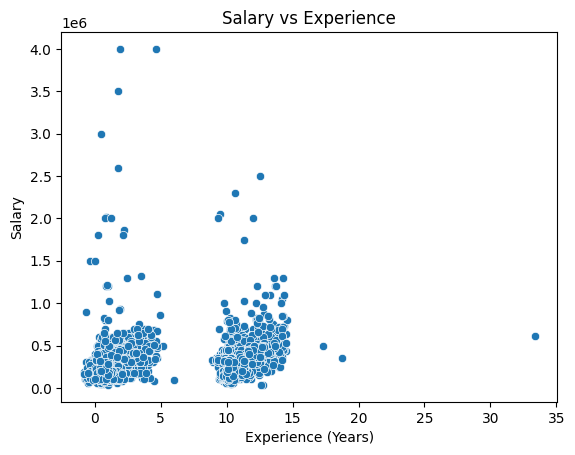

In [105]:
sns.scatterplot(x='Experience', y='Salary', data=df)

plt.title('Salary vs Experience')
plt.xlabel('Experience (Years)')
plt.ylabel('Salary')

plt.show()

In [106]:
correlation = df['Experience'].corr(df['Salary'])
print(f'Correlation between Experience and Salary: {correlation}')

Correlation between Experience and Salary: 0.24104840406401243


There is a slight positive correlation between Salary and Experience. Therefore, Experience has some effect on Salary.

**2. Is there a relationship between gender and specialization? (i.e. Does the preference of Specialization depend on the Gender?)**

In [75]:
contingency_table = pd.crosstab(df['Gender'], df['Specialization'])

chi2, p, dof, ex = chi2_contingency(contingency_table)

print("Chi-Square Test p-value:", p)

Chi-Square Test p-value: 1.2453868176976918e-06


The p-value is less than 0.05, we conclude that there is a significant relationship between gender and specialization.

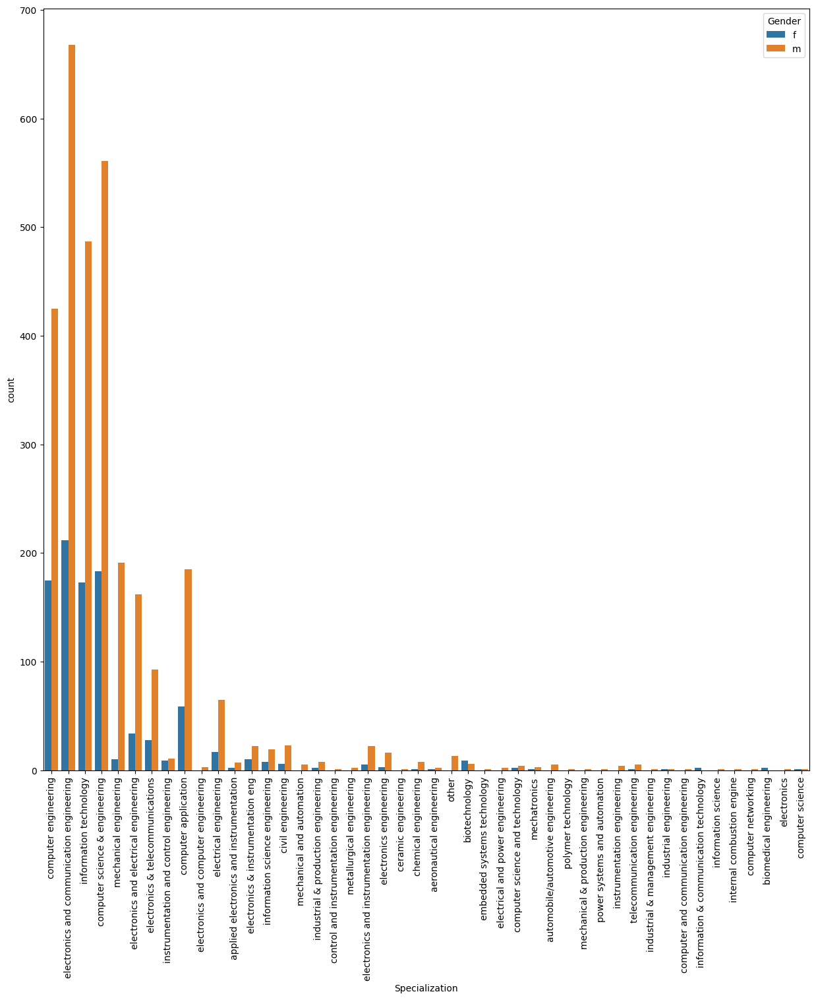

In [76]:
plt.figure(figsize=[15,15])
sns.countplot(data=df,x='Specialization',hue='Gender')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

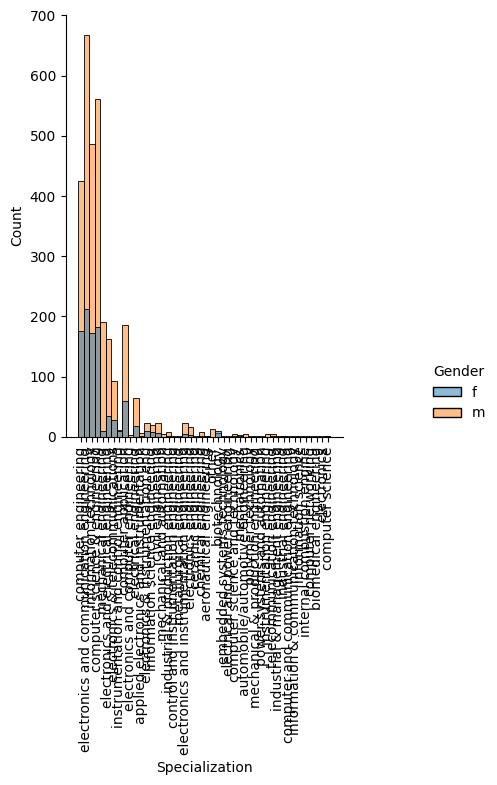

In [77]:
plt.figure(figsize=[15,15])
sns.displot(x='Specialization',hue='Gender',data=df)
plt.xticks(rotation=90)
plt.show()

In [78]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [79]:
df.groupby(by=['Gender'])['Specialization'].value_counts()

Gender  Specialization                             
f       electronics and communication engineering      212
        computer science & engineering                 183
        computer engineering                           175
        information technology                         173
        computer application                            59
        electronics and electrical engineering          34
        electronics & telecommunications                28
        electrical engineering                          17
        electronics & instrumentation eng               10
        mechanical engineering                          10
        biotechnology                                    9
        instrumentation and control engineering          9
        information science engineering                  8
        civil engineering                                6
        electronics and instrumentation engineering      5
        electronics engineering                          3
    

From both gender ECE specialization tops the list.

**3. Does high CollegeGPA result in high Salary?**

In [80]:
df['collegeGPA'].corr(df['Salary'])

0.13010251907112563

<Axes: xlabel='collegeGPA', ylabel='Salary'>

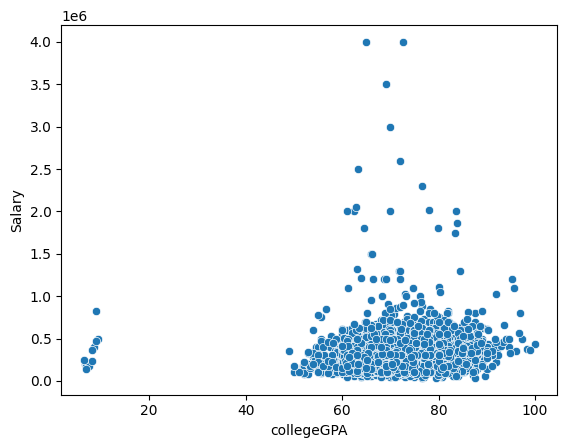

In [81]:
sns.scatterplot(data=df,x='collegeGPA',y='Salary')

In [82]:
df['collegeGPA'].sort_values().head(15)

3308     6.45
138      6.63
788      6.80
1419     6.85
2151     6.95
1767     7.56
1439     8.07
2229     8.13
7        8.58
2662     8.88
2691     8.89
2293     9.30
2836    49.07
3448    50.00
907     50.00
Name: collegeGPA, dtype: float64

In [83]:
df['collegeGPA'] = df['collegeGPA'].apply(lambda x: x * 10 if x < 10 else x)

In [84]:
df['collegeGPA'].sort_values().head(5)

2836    49.07
907     50.00
3448    50.00
3293    51.00
1400    51.80
Name: collegeGPA, dtype: float64

In [85]:
df['collegeGPA'].corr(df['Salary'])

0.14831774929008582

<Axes: xlabel='collegeGPA', ylabel='Salary'>

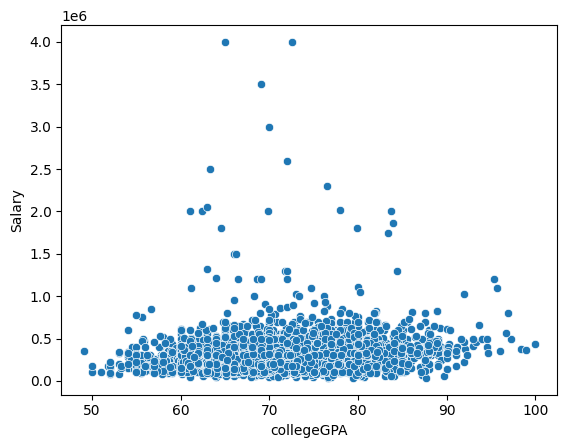

In [86]:
sns.scatterplot(data=df,x='collegeGPA',y='Salary')

We cannot conclude College GPA has strong impact on salary, although it has some slight positive correlation.

**4.Do candidates from CollegeTier 1 have significantly higher salaries compared to those from other tiers?**

In [87]:
df['CollegeTier'].value_counts()

2    3701
1     297
Name: CollegeTier, dtype: int64

In [88]:
tier1_salaries = df[df['CollegeTier'] == 1]['Salary']
other_tiers_salaries = df[df['CollegeTier'] != 1]['Salary']

f_stat, p_value = f_oneway(tier1_salaries, other_tiers_salaries)
print("ANOVA test p-value:", p_value)

ANOVA test p-value: 3.018247144438326e-30


The p-value less than 0.05 indicates significant differences between the tiers.

<Axes: xlabel='CollegeTier', ylabel='Salary'>

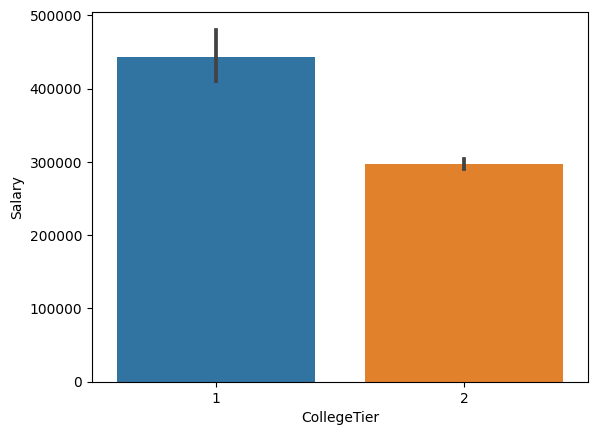

In [89]:
sns.barplot(data=df,x='CollegeTier',y='Salary')

In [90]:
df.groupby(by='CollegeTier')['Salary'].mean()

CollegeTier
1    442356.902357
2    296893.812483
Name: Salary, dtype: float64

Yes, graduates from Tier 1 colleges have significantly higher salaries

**5.Is there a significant difference in salaries between male and female candidates?**

In [91]:
male_salaries = df[df['Gender'] == 'm']['Salary']
female_salaries = df[df['Gender'] == 'f']['Salary']

t_stat, p_value = ttest_ind(male_salaries, female_salaries)
print("t-test p-value:", p_value)

t-test p-value: 0.03332394177012777


The p-value less than 0.05 indicates significant salary differences between genders.

<Axes: xlabel='Gender'>

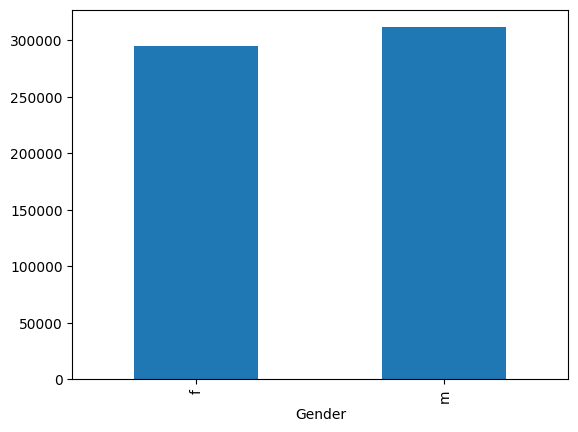

In [92]:
df.groupby(by=['Gender'])['Salary'].mean().plot(kind='bar')

In [93]:
df.groupby(by=['Gender'])['Salary'].mean()

Gender
f    294937.304075
m    311716.211772
Name: Salary, dtype: float64

Male earn higher than female on average.

**6.Do candidates with certain Specializations have higher salaries on average?**

In [94]:
df.groupby(by=['Specialization'])['Salary'].mean().sort_values(ascending=False)

Specialization
polymer technology                             700000.000000
computer networking                            565000.000000
information science                            460000.000000
instrumentation and control engineering        394000.000000
information & communication technology         387500.000000
industrial & production engineering            384500.000000
civil engineering                              381206.896552
computer engineering                           374100.000000
industrial engineering                         370000.000000
chemical engineering                           370000.000000
electronics & instrumentation eng              364531.250000
internal combustion engine                     360000.000000
applied electronics and instrumentation        348333.333333
telecommunication engineering                  342500.000000
metallurgical engineering                      337500.000000
ceramic engineering                            335000.000000
electroni

In [95]:
specialization_salaries = df.groupby('Specialization')['Salary'].apply(list)

f_stat, p_value = f_oneway(*specialization_salaries)
print("ANOVA test p-value:", p_value)

ANOVA test p-value: 8.363226896948822e-08


The p-value less than 0.05 indicates significant salary differences based on specialization.

**Top 5 average salaries earned based on specialization.**

- *polymer technology                             700000*

- *computer networking                            565000*

- *information science                            460000*

- *instrumentation and control engineering        394000*

- *information & communication technology         387500*

Yes, Salary is dependent on Specialization.

**7.Do Degree have effect on Salary?**

In [107]:
df.groupby(by=['Degree'])['Salary'].mean().sort_values(ascending=False)

Degree
M.Tech./M.E.     366132.075472
M.Sc. (Tech.)    320000.000000
B.Tech/B.E.      308622.702703
MCA              280802.469136
Name: Salary, dtype: float64

In [108]:
deg_sal = df.groupby('Degree')['Salary'].apply(list)

f_stat, p_value = f_oneway(*deg_sal)
print("ANOVA test p-value:", p_value)

ANOVA test p-value: 0.04679834663609646


The p-value is less than 0.05. With the average salary based on degree suggest that there is a slight difference in salaries with respect to the degree.

# Inferences from the Exploratory Data Analysis

**The key question to be answered here is what determines the salary and what features are important in predicting salary.**

The key features are Specialization, College Tier, Experience, Designation, Gender, College GPA, Degree that have high effect on Salary.

There are other features like State which has minimal effect on Salary.